In [1]:
# print date
import datetime
print(datetime.datetime.now().strftime("%Y-%m-%d %H:%M:%S"))

2025-11-19 17:00:46


In [2]:
import xarray as xr
import dask
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.colors as colors
import os, sys, glob, re, time, math, calendar
from scipy import stats
from scipy.stats import wasserstein_distance as wd

import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import weibull_min, spearmanr, pearsonr
from matplotlib.colors import BoundaryNorm

from sklearn.metrics import mean_absolute_error as MAE
from sklearn.metrics import mean_squared_error as MSE
from sklearn.metrics import root_mean_squared_error as RMSE
from sklearn.metrics import mean_absolute_percentage_error as MAPE
from sklearn.metrics import r2_score as R2


# import custom functions
sys.path.append('/')
from libraries import *
from plotters import *

import os
import socket

# Get the current system's hostname or username
hostname = socket.gethostname()  # Get system hostname
username = os.getlogin()  # Get logged-in username

# Set FIGDIR based on the system
if username == 'harishbaki':  # macOS system
    FIGDIR = '/Users/harishbaki/Dropbox/Apps/Overleaf/Wind_Energy_Chebyshev_based_wind_profile_evaluaiton'
else:  # Assume Linux system
    FIGDIR = '/home/harish/Dropbox/Apps/Overleaf/Wind_Energy_Chebyshev_based_wind_profile_evaluaiton'

print(f"FIGDIR is set to: {FIGDIR}")


FIGDIR is set to: /home/harish/Dropbox/Apps/Overleaf/Wind_Energy_Chebyshev_based_wind_profile_evaluaiton


In [3]:
def get_subcaption(n):
    """Return subplot label like a, b, ..., z, aa, ab, ..."""
    label = ''
    while True:
        n, r = divmod(n, 26)
        label = chr(97 + r) + label  # 97 is 'a'
        if n == 0:
            break
        n -= 1
    return label

In [4]:
profilers = pd.read_csv('data/profiler_locations.csv')
# Removing the 'PROF' in stid
profilers['stid'] = [profilers['stid'][i][5:] for i in range(len(profilers['stid']))]
profilers.rename(columns={'lat [degrees]': 'latitude [degrees]','lon [degrees]':'longitude [degrees]'}, inplace=True)
profilers

,stid,number,name,latitude [degrees],longitude [degrees],elevation [m],county,nearest_city,state,distance_from_town [km],direction_from_town [degrees],climate_division,climate_division_name,wfo,commissioned,decommissioned
0,ALB2,2018,Albany (ETEC),42.680440,-73.816240,95.00,Albany,Albany,NY,6.00,WNW,5,Hudson Valley,ALY,2024-03-28 00:00:00 UTC,NaN
1,ALBA,2003,Albany (Airport),42.751750,-73.811280,83.07,Albany,Colonie,NY,4.20,NNE,5,Hudson Valley,ALY,2017-09-01 00:00:00 UTC,NaN
2,BELL,2030,Belleville,43.788230,-76.117650,152.10,Jefferson,Belleville,NY,0.55,NNE,9,Great Lakes,BUF,2017-03-03 00:00:00 UTC,NaN
3,BRON,2026,Bronx,40.872481,-73.893522,59.31,Bronx,Bronx,NY,3.90,NW,5,Hudson Valley,OKX,2017-09-12 22:00:00 UTC,NaN
4,BUFF,2004,Buffalo,42.993590,-78.794610,185.39,Erie,Buffalo,NY,13.70,NNE,9,Great Lakes,BUF,2017-03-29 20:00:00 UTC,NaN
5,CHAZ,2029,Chazy,44.889000,-73.466340,74.29,Clinton,Chazy,NY,2.40,W,7,Champlain Valley,BTV,2017-03-02 16:30:00 UTC,NaN
6,CLYM,2019,Clymer,42.021430,-79.627460,457.45,Chautauqua,Clymer,NY,0.22,ENE,9,Great Lakes,BUF,2017-03-22 23:00:00 UTC,NaN
7,EHAM,2035,East Hampton,40.970394,-72.200940,22.97,Suffolk,East Hampton,NY,1.56,WNW,4,Coastal,OKX,2017-04-27 19:00:00 UTC,NaN
8,JORD,2027,Jordan,43.068747,-76.469993,129.46,Onondaga,Jordan,NY,0.45,NNE,10,Central Lakes,BGM,2016-11-21 17:57:00 UTC,NaN
9,OWEG,2052,Owego,42.024938,-76.253072,464.45,Tioga,Owego,NY,8.70,S,2,Eastern Plateau,BGM,2017-05-02 14:00:00 UTC,NaN


In [15]:
latex_table = (profilers.loc[[2,3,4,6,8,9,10,11,12,13,14,15,16],
                             ['stid','name','latitude [degrees]','longitude [degrees]','elevation [m]']]).to_latex(index=False)

# Replace underscores in station names with '\_' for LaTeX compatibility
latex_table = latex_table.replace("_", r"\_")

# Define the fixed width for each column (adjust widths as needed)
fixed_width_latex_table = latex_table.replace("ll", "p{0.5cm}p{0.5cm}").replace("l", "p{0.5cm}", 1)

# create a latex table
print(latex_table)

\begin{tabular}{llrrr}
\toprule
stid & name & latitude [degrees] & longitude [degrees] & elevation [m] \\
\midrule
BELL & Belleville & 43.788230 & -76.117650 & 152.100000 \\
BRON & Bronx & 40.872481 & -73.893522 & 59.310000 \\
BUFF & Buffalo & 42.993590 & -78.794610 & 185.390000 \\
CLYM & Clymer & 42.021430 & -79.627460 & 457.450000 \\
JORD & Jordan & 43.068747 & -76.469993 & 129.460000 \\
OWEG & Owego & 42.024938 & -76.253072 & 464.450000 \\
QUEE & Queens & 40.734335 & -73.815856 & 52.890000 \\
REDH & Red Hook & 41.999830 & -73.884120 & 72.850000 \\
STAT & Staten Island & 40.604014 & -74.148499 & 34.430000 \\
STON & Stony Brook & 40.919579 & -73.133284 & 55.100000 \\
SUFF & Suffern & 41.133034 & -74.085979 & 191.870000 \\
TUPP & Tupper Lake & 44.224256 & -74.441052 & 525.200000 \\
WANT & Wantagh & 40.650250 & -73.505400 & 18.250000 \\
\bottomrule
\end{tabular}



In [ ]:
# Create a copy of the selected profilers data and format the elevation column to 2 decimal places
profilers_formatted = profilers.loc[[2,3,4,6,8,9,10,11,12,13,14,15,16],
                                   ['stid','name','latitude [degrees]','longitude [degrees]','elevation [m]']].copy()

# Use a custom formatter for the elevation column to show only 2 decimal places
def format_elevation(val):
    if isinstance(val, (int, float)):
        return f"{val:.2f}"
    return val

# Create formatters dictionary - only format the elevation column
formatters = {'elevation [m]': format_elevation}

latex_table = profilers_formatted.to_latex(index=False, formatters=formatters)

# Replace underscores in station names with '\_' for LaTeX compatibility
latex_table = latex_table.replace("_", r"\_")

# Define the fixed width for each column (adjust widths as needed)
fixed_width_latex_table = latex_table.replace("ll", "p{0.5cm}p{0.5cm}").replace("l", "p{0.5cm}", 1)

# create a latex table
print(latex_table)

# Chebyshev polynomials

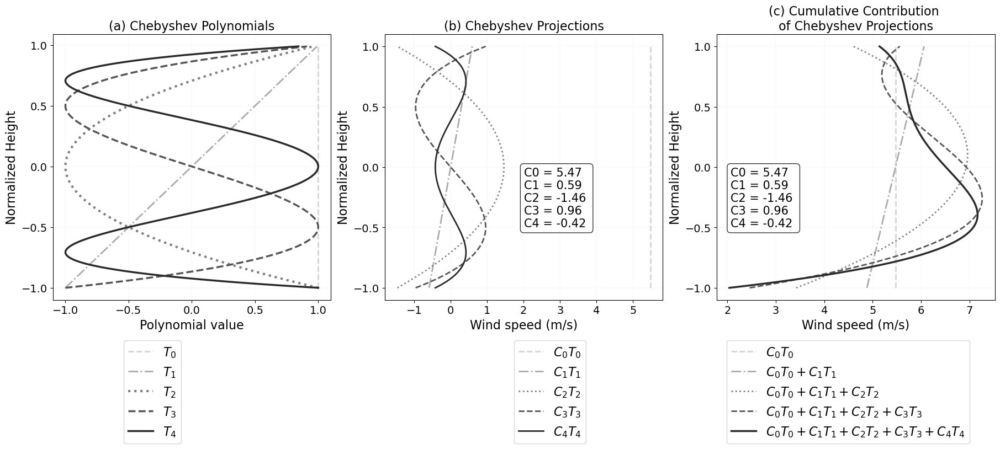

In [6]:

x = np.arange(-1, 1, 0.01)
CPtype = 1
CP = Chebyshev_Basu(x, 4, CPtype)
p = 4
# Colorblind-friendly colors
colors = ['#0072B2', '#D55E00', '#009E73', '#F0E442', '#56B4E9']
colors = ['#1b9e77', '#d95f02', '#7570b3', '#e7298a', '#66a61e']
colors = sns.color_palette("gray_r", 5)
def chebyshev_polynomials_plotter(gs):
    ax = fig.add_subplot(gs)
    
    ax.plot(CP[:, 0], x, linestyle='--', linewidth=2,label=r'$T_0$', color=colors[0])
    ax.plot(CP[:, 1], x, linestyle='-.', linewidth=2,label=r'$T_1$', color=colors[1])
    ax.plot(CP[:, 2], x, linestyle=':', linewidth=3,label=r'$T_2$', color=colors[2])
    ax.plot(CP[:, 3], x, linestyle='--', linewidth=2.5,label=r'$T_3$', color=colors[3])
    ax.plot(CP[:, 4], x, linestyle='-', linewidth=2.5,label=r'$T_4$', color=colors[4])
    
    #ax.legend(['T_0', 'T_1', 'T_2', 'T_3', 'T_4'], loc='upper right', fontsize=16)
    #ax.set_xlabel('Coefficients', fontsize=18)
    ax.set_ylabel('Normalized Height', fontsize=16)
    ax.set_xlabel('Polynomial value', fontsize=16)
    ax.set_title('(a) Chebyshev Polynomials', fontsize=16)
    # Set ticks
    ax.set_xticks(np.arange(-1, 1.1, 0.5))
    ax.set_yticks(np.arange(-1, 1.1, 0.5))
    # Set tick font size
    ax.tick_params(axis='both', which='major', labelsize=14)
    ax.grid(True, linestyle='--', alpha=0.5,linewidth=0.2)

    return ax

def Chebyshev_polynomials_projectioin_plotter(gs,C0, C1, C2, C3, C4,text_loc=(0.5, 0.5)):
    ax = fig.add_subplot(gs)
    # Create a grid of z values in the normalized interval [-1, 1]
    z = np.linspace(-1, 1, 500)

    # Define the Chebyshev polynomials of the first kind
    T0 = np.ones_like(z)
    T1 = z
    T2 = 2*z**2 - 1
    T3 = 4*z**3 - 3*z
    T4 = 8*z**4 - 8*z**2 + 1

    # Compute the individual contributions
    proj0 = C0 * T0
    proj1 = C1 * T1
    proj2 = C2 * T2
    proj3 = C3 * T3
    proj4 = C4 * T4

    # Plot the cumulative contributions with U(z) on the x-axis and z on the y-axis
    ax.plot(proj0, z, label=r"$C_0T_0$", linestyle="--", color=colors[0],linewidth=2)
    ax.plot(proj1, z, label=r"$C_1T_1$", linestyle="-.", color=colors[1], linewidth=2)
    ax.plot(proj2, z, label=r"$C_2T_2$", linestyle=":", color=colors[2], linewidth=2)
    ax.plot(proj3, z, label=r"$C_3T_3$", linestyle="--", color=colors[3], linewidth=2)
    ax.plot(proj4, z, label=r"$C_4T_4$", color=colors[4], linewidth=2)

    ax.set_xlabel("Wind speed (m/s)", fontsize=16)
    ax.set_ylabel("Normalized Height", fontsize=16)
    ax.set_title("(b) Chebyshev Projections", fontsize=16)
    ax.tick_params(axis='both', which='major', labelsize=14)
    ax.grid(True, linestyle='--', alpha=0.5, linewidth=0.2)
    ax.set_yticks(np.arange(-1, 1.1, 0.5))

    ax.text(text_loc[0], text_loc[1],
            f'C0 = {C0:.2f} \nC1 = {C1:.2f}'
            f'\nC2 = {C2:.2f} \nC3 = {C3:.2f} \nC4 = {C4:.2f}',
                      transform=ax.transAxes, verticalalignment='top', bbox=dict(boxstyle='round', facecolor='white', alpha=0.8),fontsize=15)


    return ax

def Chebyshev_polynomials_contributions_plotter(gs,C0, C1, C2, C3, C4,text_loc=(0.05, 0.5)):
    ax = fig.add_subplot(gs)
    # Create a grid of z values in the normalized interval [-1, 1]
    z = np.linspace(-1, 1, 500)

    # Define the Chebyshev polynomials of the first kind
    T0 = np.ones_like(z)
    T1 = z
    T2 = 2*z**2 - 1
    T3 = 4*z**3 - 3*z
    T4 = 8*z**4 - 8*z**2 + 1

    # Compute the individual contributions
    proj0 = C0 * T0
    proj1 = C1 * T1
    proj2 = C2 * T2
    proj3 = C3 * T3
    proj4 = C4 * T4

    # Compute cumulative sums (partial reconstructions)
    partial0 = proj0
    partial1 = proj0 + proj1
    partial2 = proj0 + proj1 + proj2
    partial3 = proj0 + proj1 + proj2 + proj3
    partial4 = proj0 + proj1 + proj2 + proj3 + proj4  # final full profile

    # Plot the cumulative contributions with U(z) on the x-axis and z on the y-axis
    ax.plot(partial0, z, label=r"$C_0T_0$", linestyle="--", color=colors[0],linewidth=2)
    ax.plot(partial1, z, label=r"$C_0T_0+C_1T_1$", linestyle="-.", color=colors[1], linewidth=2)
    ax.plot(partial2, z, label=r"$C_0T_0+C_1T_1+C_2T_2$", linestyle=":", color=colors[2], linewidth=2)
    ax.plot(partial3, z, label=r"$C_0T_0+C_1T_1+C_2T_2+C_3T_3$", linestyle="--", color=colors[3], linewidth=2)
    ax.plot(partial4, z, label=r"$C_0T_0+C_1T_1+C_2T_2+C_3T_3+C_4T_4$", color=colors[4], linewidth=2.5)

    ax.set_xlabel("Wind speed (m/s)", fontsize=16)
    ax.set_ylabel("Normalized Height", fontsize=16)
    ax.set_title("(c) Cumulative Contribution \nof Chebyshev Projections", fontsize=16)
    ax.tick_params(axis='both', which='major', labelsize=14)
    ax.grid(True, linestyle='--', alpha=0.5, linewidth=0.2)
    ax.set_yticks(np.arange(-1, 1.1, 0.5))

    ax.text(text_loc[0], text_loc[1],
            f'C0 = {C0:.2f} \nC1 = {C1:.2f}'
            f'\nC2 = {C2:.2f} \nC3 = {C3:.2f} \nC4 = {C4:.2f}',
                      transform=ax.transAxes, verticalalignment='top', bbox=dict(boxstyle='round', facecolor='white', alpha=0.8),fontsize=15)

    return ax

fig = plt.figure(figsize=(18, 6), constrained_layout=True)
gs = fig.add_gridspec(1,3)
axs = chebyshev_polynomials_plotter(gs[0,0])
# Extract legend from one of the subplots
handles, labels = axs.get_legend_handles_labels()
# Create a common legend below the figures
fig.legend(handles, labels, loc='lower center', ncol=1, bbox_to_anchor=(0.15, -0.35),fontsize=16)

# Create the second subplot
C0 = 5.47
C1 = 0.59
C2 = -1.46
C3 = 0.96
C4 = -0.42
axs = Chebyshev_polynomials_projectioin_plotter(gs[0,1],C0, C1, C2, C3, C4)
# Extract legend from one of the subplots
handles, labels = axs.get_legend_handles_labels()
# Create a common legend below the figures
fig.legend(handles, labels, loc='lower center', ncol=1, bbox_to_anchor=(0.55, -0.35),fontsize=16)

axs = Chebyshev_polynomials_contributions_plotter(gs[0,2],C0, C1, C2, C3, C4)
# Extract legend from one of the subplots
handles, labels = axs.get_legend_handles_labels()
# Create a common legend below the figures
fig.legend(handles, labels, loc='lower center', ncol=1, bbox_to_anchor=(0.85, -0.35),fontsize=16)

plt.savefig(f'{FIGDIR}/Chebyshev_Polynomials.pdf', dpi=300, bbox_inches='tight')

# Plotting well-known profiles

In [13]:
def profle_plotter(gs,Z,M,title,xlabel=None,ylabel=None,legend=None,text_loc=None,xlims=[0, 21],ylims=[0, 500],xticks=None,yticks=None):
    ax = fig.add_subplot(gs)
    ChSh = Chebyshev_Coeff(Z,M, poly_order=poly_order, CPtype=1, ref_H=ref_H)
    Z_ = np.linspace(10, 500, 100)
    Mp = WindProfile(Z_, ChSh, poly_order=poly_order, CPtype=1, ref_H=ref_H)
    ax.plot(M, Z, 'ok', markerfacecolor='k',label='Observed wind speeds')
    ax.plot(Mp, Z_, '-k', linewidth=2,label='Chebyshev fitted profile')

    mean_M = np.mean(M)
    mean_Mp = np.mean(Mp)

    if text_loc:
        ax.text(text_loc[0], text_loc[1], rf'$\overline{{U}}$: {mean_M:.2f} m/s'
            f'\nC0 = {ChSh[0]:.2f} \nC1 = {ChSh[1]:.2f}'
            f'\nC2 = {ChSh[2]:.2f} \nC3 = {ChSh[3]:.2f} \nC4 = {ChSh[4]:.2f}',
                      transform=ax.transAxes, verticalalignment='top', bbox=dict(boxstyle='round', facecolor='white', alpha=0.8),fontsize=15)

    ax.set_xlim(xlims)
    ax.set_ylim(ylims)
    ax.tick_params(labelsize=18)
    ax.set_title(title,fontsize=18)
    if xlabel:
        ax.set_xlabel(xlabel,fontsize=18)
    if ylabel:
        ax.set_ylabel(ylabel,fontsize=18)
    if legend:
        ax.legend(fontsize=18)
    if xticks is not None:
        ax.set_xticks(xticks)
    else:
        ax.set_xticks([0,5,10,15,20])  # Explicitly remove x-ticks if None
        ax.set_xticklabels([])  # Explicitly remove x-ticks if None

    if yticks is not None:
        ax.set_yticks(yticks)
    else:
        ax.set_yticks([10,100,200,300,400,500])
        ax.set_yticklabels([])  # Explicitly remove y-ticks if None

    return ax

## Leipzig

In [8]:
# read Leipzig.dat file
Leipzig = pd.read_csv('data/Leipzig/Leipzig.dat', sep='\s+', header=None)
# compute wind speed by taking square root of sum of squares of 2nd and 3rd columns, and add it as a new column
Leipzig['WS'] = np.sqrt(Leipzig.iloc[:,1]**2 + Leipzig.iloc[:,2]**2)
target_index = Leipzig[Leipzig.iloc[:, 0] == 500].index[0]
# Select all rows up to and including the row where the height reaches 100 m
Leipzig = Leipzig.iloc[:target_index + 1]

## Wangara

In [9]:
# read Leipzig.dat file
Wangara_1 = pd.read_csv('data/Wangara_ASCII/Wangara_UV3318.txt', sep='\s+', header=None, skiprows=1)
# compute wind speed by taking square root of sum of squares of 2nd and 3rd columns, and add it as a new column
Wangara_1['WS'] = np.sqrt(Wangara_1.iloc[:,1]**2 + Wangara_1.iloc[:,2]**2)
target_index = Wangara_1[Wangara_1.iloc[:, 0] == 500].index[0]
# Select all rows up to and including the row where the height reaches 100 m
Wangara_1 = Wangara_1.iloc[:target_index + 1]

Wangara_2 = pd.read_csv('data/Wangara_ASCII/Wangara_UV3403.txt', sep='\s+', header=None, skiprows=1)
# compute wind speed by taking square root of sum of squares of 2nd and 3rd columns, and add it as a new column
Wangara_2['WS'] = np.sqrt(Wangara_2.iloc[:,1]**2 + Wangara_2.iloc[:,2]**2)
target_index = Wangara_2[Wangara_2.iloc[:, 0] == 500].index[0]
# Select all rows up to and including the row where the height reaches 100 m
Wangara_2 = Wangara_2.iloc[:target_index + 1]

## Hovsore

In [10]:
files = [f'data/Hovsore_TallWind/case{i}_wind.txt' for i in range(1, 11)]
Hovsore = {}
for i,file in enumerate(files):
    df = pd.read_csv(file, sep='\s+', header=None,skiprows=1)
    # compute wind speed by taking square root of sum of squares of 2nd and 3rd columns, and add it as a new column
    df['WS'] = np.sqrt(df.iloc[:,1]**2 + df.iloc[:,2]**2)
    target_index = df[df.iloc[:, 0] == 500].index[0]
    # Select all rows up to and including the row where the height reaches 100 m
    df = df.iloc[:target_index + 1]
    Hovsore[f'case{i+1}'] = df

## Wantagh

In [11]:
profiler_profiles_ds = xr.open_dataset(f'data/NYSM_standard_and_profiler_combined_wind_speed/zeroth_method/PROF_WANT.nc').wind_speed
Wantagh1 = profiler_profiles_ds.sel(range=slice(10,500),time='2021-06-27T21:00').values
Wantagh2 = profiler_profiles_ds.sel(range=slice(10,500),time='2020-07-22T21:00').values

## Combine plots

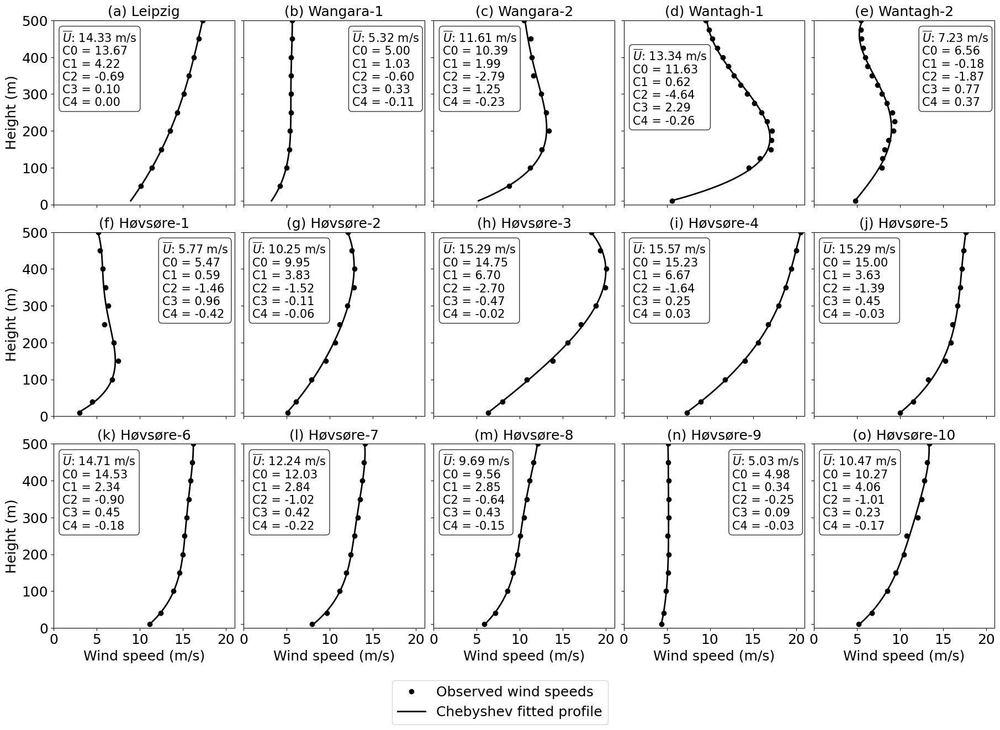

In [14]:
files = [f'data/Hovsore_TallWind/case{i}_wind.txt' for i in range(1, 11)]
fig = plt.figure(figsize=(18, 12), constrained_layout=True)
gs = fig.add_gridspec(3,5)
text_loc1 = [0.55, 0.35]
xticks = None
yticks = [0, 100, 200, 300, 400, 500]
axs = profle_plotter(gs[0,0], Leipzig[0].values, Leipzig['WS'].values, '(a) Leipzig', xlabel='', ylabel='Height (m)',text_loc=[0.05, 0.95],xticks=xticks,yticks=yticks)
yticks = None
axs = profle_plotter(gs[0,1], Wangara_1[0].values, Wangara_1['WS'].values, '(b) Wangara-1', xlabel='', ylabel='',text_loc=[0.6, 0.95],xticks=xticks,yticks=yticks)
axs = profle_plotter(gs[0,2], Wangara_2[0].values, Wangara_2['WS'].values, '(c) Wangara-2', xlabel='', ylabel='',text_loc=[0.05, 0.95],xticks=xticks,yticks=yticks)
axs = profle_plotter(gs[0,3], profilers_levels, Wantagh1, '(d) Wantagh-1', xlabel='', ylabel='',text_loc=[0.05, 0.85],xticks=xticks,yticks=yticks)
axs = profle_plotter(gs[0,4], profilers_levels, Wantagh2, '(e) Wantagh-2', xlabel='', ylabel='',text_loc=[0.6, 0.95],xticks=xticks,yticks=yticks)

chars = ['(f)', '(g)', '(h)', '(i)', '(j)','(k)','(l)','(m)','(n)','(o)']
for j,i in enumerate(np.arange(1,11,1)):
    row,col = divmod(j,5)
    row = row +1
    yticks = [0, 100, 200, 300, 400, 500] if col == 0 else None
    xticks = [0, 5, 10, 15, 20] if row == 2 else None
    xlabel = 'Wind speed (m/s)' if row == 2 else None
    ylabel = 'Height (m)' if col == 0 else None

    if (row==1 and col==0) or (row==2 and col==3):
        text_loc = [0.6, 0.95]
    else:
        text_loc = [0.05, 0.95]
    axs = profle_plotter(gs[row,col], Hovsore[f'case{i}'][0].values, Hovsore[f'case{i}']['WS'].values, f'{chars[j]} Høvsøre-{i}', xlabel=xlabel, ylabel=ylabel,text_loc=text_loc,xticks=xticks,yticks=yticks)
# Extract legend from one of the subplots
handles, labels = axs.get_legend_handles_labels()
# Create a common legend below the figures
fig.legend(handles, labels, loc='lower center', ncol=1, bbox_to_anchor=(0.5, -0.1),fontsize=18)
plt.savefig(f'{FIGDIR}/Standard_Leipzig_Wangara_Hovsore_WindProfiles.pdf', dpi=300, bbox_inches='tight')


# Examining the VC penalty for polynomial order

## All non-missing instances

In [5]:
%%time

CPtype = 1
profiler_stations = pd.read_csv('data/profiler_locations.csv',usecols=[0,3,4])
R_EMP = {}
R_EST = {}
Penalty_Factor = {}
for index, row in profiler_stations.iterrows():
    station_id = row['stid']
    print(station_id)
    try:
        # Load profiler data
        ds = xr.open_dataset(f'data/NYSM_standard_and_profiler_combined_wind_speed/zeroth_method/{station_id}.nc')
        data = ds.wind_speed.sel(range=slice(10,500))
        Z = data.range.values

        # All non-missing mask
        all_non_missing_mask = data.notnull().all(dim='range')

        # Filter the data
        filtered_data = data.where(all_non_missing_mask, drop=True)

        # Number of observations, time steps, and height levels
        n_height,n_time = filtered_data.shape
        print(n_height,n_time)

        # Define polynomial orders 
        P = np.arange(1,11)

        R_emp = np.zeros((n_time, len(P)))
        R_est = np.zeros((n_time, len(P)))
        penalty_factor = np.zeros((n_time, len(P)))

        # Iterate over time steps
        U = filtered_data.values
        stime = time.time()
        for t in range(n_time):
            M = U[:, t]
            N = len(Z)  # Number of data points
            for p in P:
                ChSh = Chebyshev_Coeff(Z,M, poly_order=p, CPtype=1, ref_H=ref_H)
                Mp = WindProfile(Z, ChSh, poly_order=p, CPtype=1, ref_H=ref_H)
                remp = np.mean((Mp - M)**2)
                R_emp[t, p - 1] = remp

                # Compute Penalization Factor
                D = (p + 1) / N  # Normalized VC-dimension
                Penfac = 1 / (1 - np.sqrt(D - D * np.log(D) + np.log(N) / (2 * N)))
                penalty_factor[t, p - 1] = Penfac

                # Compute Estimated Risk as a function of polynomial order
                rest = remp * Penfac
                R_est[t, p - 1] = rest

        R_EMP[station_id] = R_emp
        R_EST[station_id] = R_est
        Penalty_Factor[station_id] = penalty_factor

    except Exception as e:
        print(f'Error for station {station_id}: {e}')

PROF_ALB2
Error for station PROF_ALB2: [Errno 2] No such file or directory: '/home/harish/Ongoing_Research/Characterization-of-wind-speed-profiles-using-Chebyshev-approximation/data/NYSM_standard_and_profiler_combined_wind_speed/zeroth_method/PROF_ALB2.nc'
PROF_ALBA
Error for station PROF_ALBA: [Errno 2] No such file or directory: '/home/harish/Ongoing_Research/Characterization-of-wind-speed-profiles-using-Chebyshev-approximation/data/NYSM_standard_and_profiler_combined_wind_speed/zeroth_method/PROF_ALBA.nc'
PROF_BELL
18 112092
PROF_BRON
18 185018
PROF_BUFF
18 140592
PROF_CHAZ
18 135035
PROF_CLYM
18 127372
PROF_EHAM
Error for station PROF_EHAM: [Errno 2] No such file or directory: '/home/harish/Ongoing_Research/Characterization-of-wind-speed-profiles-using-Chebyshev-approximation/data/NYSM_standard_and_profiler_combined_wind_speed/zeroth_method/PROF_EHAM.nc'
PROF_JORD
18 126349
PROF_OWEG
18 169342
PROF_QUEE
18 190458
PROF_REDH
18 170356
PROF_STAT
18 142232
PROF_STON
18 138373
PROF_SUFF

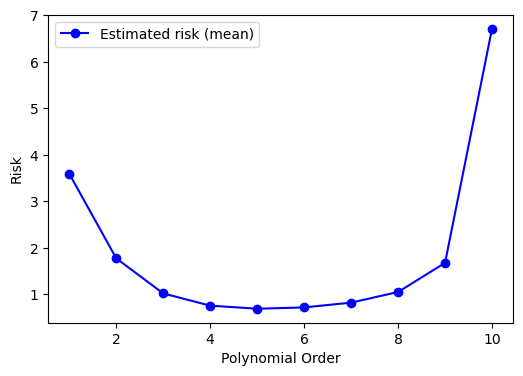

In [101]:
# concat R_EMP
R_EST_concat = np.concatenate(list(R_EST.values()), axis=0)

# Now, plot the R_emp, R_est, and penalty_factor, mean and quantiles
fig, ax = plt.subplots(figsize=(6, 4))
ax.plot(P, R_EST_concat.mean(axis=0), marker='o', label='Estimated risk (mean)', color='blue')
# median_r_est = np.median(R_EST_concat, axis=0)
# ax.plot(P, median_r_est, marker='o', linestyle='--', label='Estimated Risk (Median)', color='red')
# ax.fill_between(P,
#                 np.quantile(R_EST_concat, 0.25, axis=0),
#                 np.quantile(R_EST_concat, 0.75, axis=0),
#                 color='red',
#                 alpha=0.2,
#                 label='Estimated Risk Quantiles (25th–75th)')
ax.set_xlabel('Polynomial Order')
ax.set_ylabel('Risk')
ax.legend()

# Save the plot
plt.savefig(f'{FIGDIR}/Risk_and_Penalty_Factor_for_all_stations.pdf', dpi=300, bbox_inches='tight')

## Conditional missing

In [42]:
%%time
poly_order = 4
CPtype = 1
profiler_stations = pd.read_csv('data/profiler_locations.csv',usecols=[0,3,4])
station_id = 'PROF_WANT'
print(station_id)
try:
    # Load profiler data
    ds = xr.open_dataset(f'data/NYSM_standard_and_profiler_combined_wind_speed/zeroth_method/{station_id}.nc')
    data = ds.wind_speed.sel(range=slice(10,500))
    Z = data.range.values

    # Define the number of required non-missing points for intermediate range
    intermediate_non_missing_points = 4

    # Masks to ensure non-missing points in each segment
    first_segment_mask = data.sel(range=slice(100, 200)).notnull().sum(dim='range') >= 2
    last_segment_mask = data.sel(range=slice(400, 500)).notnull().sum(dim='range') >= 2
    intermediate_segment_mask = data.sel(range=slice(225, 375)).notnull().sum(dim='range') >= intermediate_non_missing_points

    # Combine masks to select data meeting all conditions
    conditional_non_missing_mask = first_segment_mask & last_segment_mask & intermediate_segment_mask
    filtered_data = data.where(conditional_non_missing_mask, drop=True)

    # Number of observations, time steps, and height levels
    n_height,n_time = filtered_data.shape
    print(n_height,n_time)

    # Define polynomial orders 
    P = np.arange(1,11)

    R_emp = np.zeros((n_time, len(P)))
    R_est = np.zeros((n_time, len(P)))
    penalty_factor = np.zeros((n_time, len(P)))

    # Iterate over time steps
    U = filtered_data.values
    stime = time.time()
    for t in range(n_time):
        M = U[:, t]
        for p in P:
            ChSh = Chebyshev_Coeff(Z,M, poly_order=p, CPtype=1, ref_H=ref_H)
            Mp = WindProfile(Z, ChSh, poly_order=p, CPtype=1, ref_H=ref_H)
            remp = np.mean((Mp - M)**2)
            R_emp[t, p - 1] = remp

            # Compute Penalization Factor
            D = (p + 1) / N  # Normalized VC-dimension
            Penfac = 1 / (1 - np.sqrt(D - D * np.log(D) + np.log(N) / (2 * N)))
            penalty_factor[t, p - 1] = Penfac

            # Compute Estimated Risk as a function of polynomial order
            rest = remp * Penfac
            R_est[t, p - 1] = rest

except Exception as e:
    print(f'Error for station {station_id}: {e}')

PROF_WANT
18 186989
CPU times: user 5h 14min 32s, sys: 16min 35s, total: 5h 31min 8s
Wall time: 5min 27s


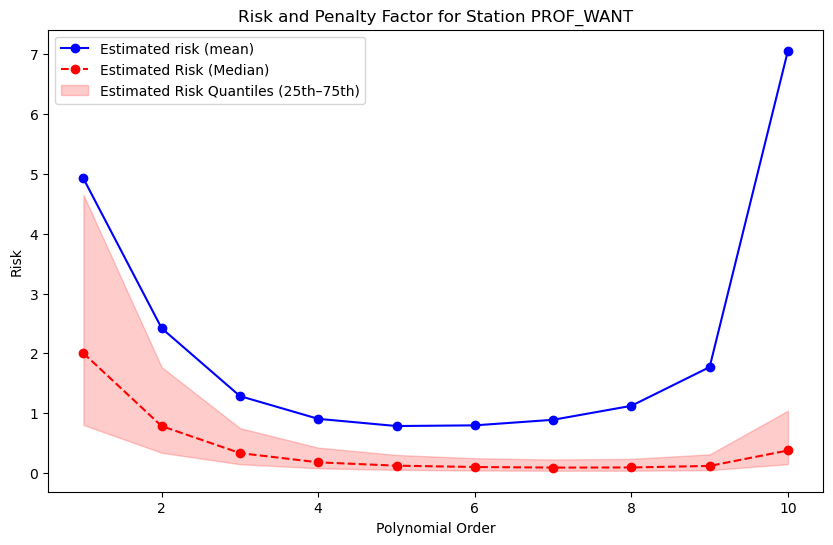

In [49]:
# Now, plot the R_emp, R_est, and penalty_factor, mean and quantiles
fig, ax = plt.subplots(figsize=(10, 6))
ax.plot(P, np.nanmean(R_est,axis=0), marker='o', label='Estimated risk (mean)', color='blue')
#ax.fill_between(P, np.quantile(R_emp, 0.25, axis=0), np.quantile(R_emp, 0.75, axis=0), color='blue', alpha=0.2, label='Empirical Risk Quantiles (25th-75th)')
median_r_est = np.nanmedian(R_est, axis=0)
ax.plot(P, median_r_est, marker='o', linestyle='--', label='Estimated Risk (Median)', color='red')
ax.fill_between(P,
                np.nanquantile(R_est, 0.25, axis=0),
                np.nanquantile(R_est, 0.75, axis=0),
                color='red',
                alpha=0.2,
                label='Estimated Risk Quantiles (25th–75th)')
ax.set_xlabel('Polynomial Order')
ax.set_ylabel('Risk')
ax.legend()
plt.title(f'Risk and Penalty Factor for Station {station_id}')
plt.show()

In [35]:
# Combine into a DataFrame
df_Wantagh1 = pd.DataFrame({
    'Height (m)': profilers_levels,
    'Wind Speed (m/s)': Wantagh1
})

In [75]:
from itertools import combinations
import numpy as np

# Step 1: Setup
df = df_Wantagh1.dropna()  # Drop missing wind speed entries
heights = df['Height (m)'].values
wind_speeds = df['Wind Speed (m/s)'].values

# Step 2: Initialize dictionary to hold valid profiles by combination size
valid_profiles_dict = {}

# Step 3: Loop over different combination sizes
for comb_size in range(5, 12):  # from 5 to 11 inclusive
    valid_profiles = []
    for comb in combinations(range(len(heights)), comb_size):
        selected_heights = heights[list(comb)]
        selected_wind_speeds = wind_speeds[list(comb)]

        # Check your custom conditions
        cond0 = selected_heights[0] == 10  # First height must be 10 m
        cond1 = np.sum((100 <= selected_heights) & (selected_heights <= 200)) >= 2
        cond2 = np.sum((225 <= selected_heights) & (selected_heights <= 375)) >= 4
        cond3 = np.sum((400 <= selected_heights) & (selected_heights <= 500)) >= 2

        if cond0 and cond1 and cond2 and cond3:
            profile = df.iloc[list(comb)]
            valid_profiles.append(profile)

    valid_profiles_dict[comb_size] = valid_profiles
    print(f"comb_size={comb_size}: Found {len(valid_profiles)} valid profiles.")

comb_size=5: Found 0 valid profiles.
comb_size=6: Found 0 valid profiles.
comb_size=7: Found 0 valid profiles.
comb_size=8: Found 0 valid profiles.
comb_size=9: Found 3500 valid profiles.
comb_size=10: Found 9100 valid profiles.
comb_size=11: Found 11900 valid profiles.


In [ ]:
Z_ = np.linspace(10, 500, 100)

# Storage lists
cheb_list = []
mp_list = []
height_list = []
windspeed_list = []

for i in range(len(valid_profiles)):
    h = valid_profiles[i]['Height (m)'].values
    u = valid_profiles[i]['Wind Speed (m/s)'].values

    ChSh = Chebyshev_Coeff(h, u, poly_order=poly_order, CPtype=1, ref_H=ref_H)
    Mp = WindProfile(Z_, ChSh, poly_order=poly_order, CPtype=1, ref_H=ref_H)
    
    cheb_list.append(ChSh)
    mp_list.append(Mp)
    height_list.append(h)
    windspeed_list.append(u)

import pandas as pd

df_ChSh = pd.DataFrame(cheb_list)
df_Mp = pd.DataFrame(mp_list, columns=Z_)

# Combine all info per profile in a list of dicts (optional)
profile_data = [
    {
        'Height': height_list[i],
        'WindSpeed': windspeed_list[i],
        'Chebyshev': cheb_list[i],
        'Fitted': mp_list[i]
    }
    for i in range(len(mp_list))
]

ChSh_target = Chebyshev_Coeff(df_Wantagh1['Height (m)'].values,
                               df_Wantagh1['Wind Speed (m/s)'].values,
                               poly_order=poly_order, CPtype=1, ref_H=ref_H)
Mp_target = WindProfile(Z_, ChSh_target, poly_order=poly_order, CPtype=1, ref_H=ref_H)

rmse_list = [np.mean((Mp - Mp_target) ** 2) for Mp in mp_list]
best_idx = np.argmin(rmse_list)

# Access best profile
best_h = height_list[best_idx]
best_u = windspeed_list[best_idx]
best_Mp = mp_list[best_idx]
best_ChSh = cheb_list[best_idx]

In [93]:
import math
math.comb(5,2)*math.comb(7,4)*math.comb(5,2
                                        )

3500

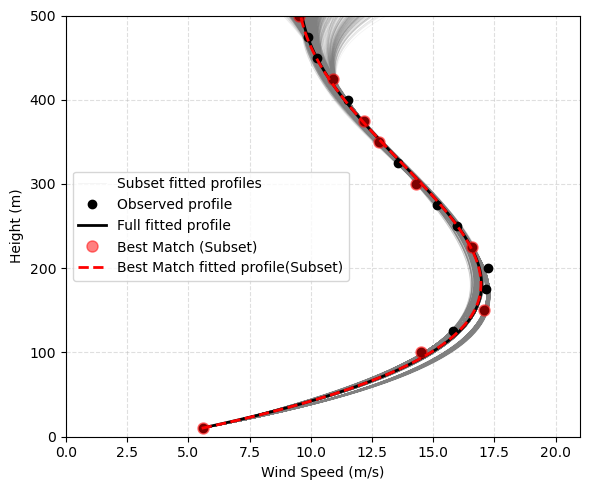

In [100]:
# Save as CSV if needed
# df_ChSh.to_csv("chebyshev_coefficients.csv", index=False)
# df_Mp.to_csv("fitted_profiles.csv", index=False)

# Plot best match
fig, ax = plt.subplots(figsize=(6, 5))
# Add label only for the first profile
for i, profile in enumerate(mp_list):
    if i == 0:
        ax.plot(profile, Z_, 'grey', linewidth=0.5, alpha=0.1, label='Subset fitted profiles')
    else:
        ax.plot(profile, Z_, 'grey', linewidth=0.5, alpha=0.1)
ax.plot(df_Wantagh1['Wind Speed (m/s)'].values,df_Wantagh1['Height (m)'].values, 'ok', markerfacecolor='k',label='Observed profile')
ax.plot(Mp_target, Z_, 'k-', label='Full fitted profile', linewidth=2)
ax.plot(best_u, best_h, 'or', markerfacecolor='r', label='Best Match (Subset)', markersize=8,alpha=0.5)
ax.plot(best_Mp, Z_, 'r--', label='Best Match fitted profile(Subset)', linewidth=2)
ax.set_xlabel('Wind Speed (m/s)')
ax.set_ylabel('Height (m)')
ax.legend(loc='best')
ax.set_xlim([0, 21])
ax.set_ylim([0, 500])
ax.grid(True, linestyle='--', alpha=0.4)
plt.tight_layout()

# Save the plot
plt.savefig(f'{FIGDIR}/Best_Match_Wantagh_Profiles.pdf', dpi=300, bbox_inches='tight')

# Lidar vs NOW23

## Computing NOW23 Chebyshev coefficients
- In this particular case, I noticed the NOW23 chebyshev coefficients showing C4 very high, because no points between 300-400 and 400-500. 
- To do a good, better only consider 10, 100, ... levels

poly_order = 4
CPtype = 1
output_dir = f'data/NOW23_Chebyshev_Coefficients/zeroth_method/polyorder_4/excluding_levels_between_10-100m'
os.makedirs(output_dir, exist_ok=True)

profiler_stations = pd.read_csv('data/profiler_locations.csv',usecols=[0,3,4])
for index, row in profiler_stations.iterrows():
    station_id = row['stid']
    print(station_id)
    try:
        # Load profiler data
        ds = xr.open_dataset(f'data/NOW23_profiles/zeroth_method/{station_id}.nc')
        Z = np.array([10,100, 120, 140, 160, 180, 200, 220, 240,260, 280, 300, 400, 500,])
        data = ds.wind_speed.sel(levels=Z)

        target_file = f'{output_dir}/{station_id}.nc'
        # Number of observations, time steps, and height levels
        n_time, n_height = data.shape

        # Initialize Coeff array
        Coeff = np.zeros((n_time, poly_order+1))
        # Iterate over time steps
        U = data.values
        stime = time.time()
        for t in range(n_time):
            Coeff[t, :] = Chebyshev_Coeff(Z, U[t,:],poly_order=poly_order, CPtype=CPtype, ref_H=ref_H)
        etime = time.time()
        print(f'Time elapsed: {etime-stime}s')

        coeff_da = xr.DataArray(Coeff, dims=['time', 'coeff'], coords={'time': data.time.values, 'coeff': np.arange(poly_order+1)},name='Chebyshev_Coefficients')

        # Save the coefficients to a netCDF file
        
        coeff_da.to_netcdf(f'{target_file}.nc')
        print(f'Saved coefficients for station {station_id}')
    
    except Exception as e:
        print(f'Error for station {station_id}: {e}')
        continue

In [5]:
test_station_ids = ['PROF_CLYM','PROF_OWEG','PROF_STAT','PROF_STON','PROF_QUEE','PROF_SUFF','PROF_BUFF','PROF_BELL','PROF_TUPP',
                    'PROF_WANT','PROF_BRON','PROF_REDH','PROF_JORD']
coastal_sites = ['PROF_BUFF','PROF_BELL','PROF_STAT','PROF_STON','PROF_QUEE','PROF_WANT','PROF_BRON']
inland_sites = ['PROF_CLYM','PROF_OWEG','PROF_SUFF','PROF_TUPP','PROF_REDH','PROF_JORD']
test_dates_range = ('2018-01-01T00:00:00', '2020-12-31T23:00:00')

profiler_coeff_all, NOW23_coeff_all = {},{}
profiler_profiles_all, NOW23_profiles_all = {},{}
for station_id in test_station_ids:
    profiler_ds  = xr.open_dataset(f'data/Profiler_Chebyshev_Coefficients/zeroth_method/{station_id}.nc')
    profiler_data = profiler_ds.Chebyshev_Coefficients.sel(time=slice('2018-01-01T00',f'2020-12-31T23'))
    # Extracting non_missing and excluding outliers
    profiler_data = profiler_data.where(profiler_data.non_missing_outlier==1, drop=True)

    NOW23_ds = xr.open_dataset(f'data/NOW23_Chebyshev_Coefficients/zeroth_method/polyorder_4/excluding_levels_between_10-100m/{station_id}.nc')
    NOW23_data = NOW23_ds.Chebyshev_Coefficients.sel(time=slice('2018-01-01T00',f'2020-12-31T23'))
    NOW23_data = NOW23_data.sel(time=profiler_data.time.values)
    profiler_coeff_all[station_id] = profiler_data
    NOW23_coeff_all[station_id] = NOW23_data

    # true profiler and NOW23 data
    profiler_profiles_ds = xr.open_dataset(f'data/NYSM_standard_and_profiler_combined_wind_speed/zeroth_method/{station_id}.nc').wind_speed
    NOW23_profiles_ds = xr.open_dataset(f'data/NOW23_profiles/zeroth_method/{station_id}.nc').wind_speed

    profiler_profiles = profiler_profiles_ds.sel(range=slice(10,500),time=profiler_data.time.values).T
    profiler_profiles = profiler_profiles.rename({'range':'levels'})
    NOW23_profiles = NOW23_profiles_ds.sel(time=profiler_data.time.values)
    profiler_profiles_all[station_id] = profiler_profiles
    NOW23_profiles_all[station_id] = NOW23_profiles

    print(f'{station_id} processed', profiler_data.time.size, NOW23_data.time.size, profiler_profiles.time.size, NOW23_profiles.time.size)

PROF_CLYM processed 58453 58453 58453 58453
PROF_OWEG processed 85416 85416 85416 85416
PROF_STAT processed 74486 74486 74486 74486
PROF_STON processed 61060 61060 61060 61060
PROF_QUEE processed 81728 81728 81728 81728
PROF_SUFF processed 27599 27599 27599 27599
PROF_BUFF processed 54258 54258 54258 54258
PROF_BELL processed 41997 41997 41997 41997
PROF_TUPP processed 53690 53690 53690 53690
PROF_WANT processed 95547 95547 95547 95547
PROF_BRON processed 90262 90262 90262 90262
PROF_REDH processed 74952 74952 74952 74952
PROF_JORD processed 80247 80247 80247 80247


## Wind speed profiles comparison

In [6]:
# combine the coefficient data
profiler_profiles_combined = xr.concat([profiler_profiles_all[station_id] for station_id in test_station_ids], dim='time')
NOW23_profiles_combined = xr.concat([NOW23_profiles_all[station_id] for station_id in test_station_ids], dim='time')

In [7]:
profiler_profiles_inland = xr.concat([profiler_profiles_all[station_id] for station_id in inland_sites], dim='time')
NOW23_profiles_inland = xr.concat([NOW23_profiles_all[station_id] for station_id in inland_sites], dim='time')

In [8]:
profiler_profiles_coastal = xr.concat([profiler_profiles_all[station_id] for station_id in coastal_sites], dim='time')
NOW23_profiles_coastal = xr.concat([NOW23_profiles_all[station_id] for station_id in coastal_sites], dim='time')

In [11]:
common_levels = np.intersect1d(profiler_profiles_all['PROF_BUFF'].levels.values, NOW23_profiles_all['PROF_BUFF'].levels.values)
def vertical_profile_plotter(ax,data,levels,label,title=None,xlabel=None,ylabel=None,
                             xlim=None, ylim=None,xticks=None,xtick_labels=True,yticks=None,ytick_labels=True,fontsize=16,
                             color='k',linestyle='-',marker='o',
                             xminor_ticks=None,
                             text_loc=None,text=None):
    ax.plot(data, levels, label=label,linestyle=linestyle,marker=marker,color=color,linewidth=2,markersize=8)
    ax.tick_params(labelsize=fontsize)
    ax.set_title(title,fontsize=fontsize)
    if xlabel:
        ax.set_xlabel(xlabel,fontsize=fontsize)
    if ylabel:
        ax.set_ylabel(ylabel,fontsize=fontsize)
    ax.set_xticks(xticks)
    if xminor_ticks:
        ax.set_xticks(xminor_ticks, minor=True)
    if not xtick_labels:
        ax.set_xticklabels([])  # Explicitly remove x-ticks if None
    ax.set_yticks(yticks)
    if not ytick_labels:
        ax.set_yticklabels([])  # Explicitly remove y-ticks if None
    if xlim:
        ax.set_xlim(xlim)
    if ylim:
        ax.set_ylim(ylim)

    if text_loc:
        ax.text(text_loc[0], text_loc[1], text,
                transform=ax.transAxes, verticalalignment='top',
                bbox=dict(boxstyle='round', facecolor='white', alpha=0.8),fontsize=fontsize)

    return ax


def weibull_scale(data):
    shape, loc, scale = weibull_min.fit(data, floc=0)
    return scale

def weibull_shape(data):
    shape, loc, scale = weibull_min.fit(data, floc=0)
    return shape


def centered_rmse(actual, predicted):
    """
    Calculates the centered Root Mean Squared Error (CRMSE).

    Args:
        actual (list or np.ndarray): List or array of actual values.
        predicted (list or np.ndarray): List or array of predicted values.

    Returns:
        float: The centered RMSE value.
    """
    actual = np.array(actual)
    predicted = np.array(predicted)
    
    # Calculate the centered values by subtracting the mean
    actual_centered = actual - np.mean(actual)
    predicted_centered = predicted - np.mean(predicted)
    
    # Calculate the squared differences of the centered values
    squared_diff = (predicted_centered - actual_centered) ** 2
    
    # Calculate the mean of the squared differences
    mse = np.mean(squared_diff)
    
    # Calculate the square root of the MSE
    rmse = np.sqrt(mse)
    
    return rmse

def correlation_coefficient(actual, predicted):
    """
    Calculates the correlation coefficient between two sets of values.

    Args:
        actual (list or np.ndarray): List or array of actual values.
        predicted (list or np.ndarray): List or array of predicted values.

    Returns:
        float: The correlation coefficient between the two sets of values.
    """
    actual = np.array(actual)
    predicted = np.array(predicted)
    
    # Calculate the correlation coefficient
    corr_coeff = np.corrcoef(actual, predicted)[0, 1]
    
    return corr_coeff

def Earth_Movers_Distance(actual, predicted):
    """
    Calculates the Earth Mover's Distance (EMD) between two distributions.

    Args:
        actual (list or np.ndarray): List or array of actual values.
        predicted (list or np.ndarray): List or array of predicted values.

    Returns:
        float: The EMD value between the two distributions.
    """
    actual = np.array(actual)
    predicted = np.array(predicted)
    
    # Calculate the EMD
    emd = wd(actual, predicted)
    
    return emd

def Normalized_EMD(actual, predicted):
    """
    Calculates the Normalized Earth Mover's Distance (NEMD) between two distributions.

    Args:
        actual (list or np.ndarray): List or array of actual values.
        predicted (list or np.ndarray): List or array of predicted values.

    Returns:
        float: The NEMD value between the two distributions.
    """
    actual = np.array(actual)
    predicted = np.array(predicted)
    
    # Calculate the EMD
    emd = wd(actual, predicted)
    
    # Normalize the EMD by dividing by the maximum possible distance
    max_distance = np.max([np.sum(np.abs(actual)), np.sum(np.abs(predicted))])
    nemd = emd / max_distance
    
    return nemd

In [399]:
def compute_statistics(prof_values, now_values):
    stats = {
        'mean': {
            'profiler': prof_values.mean(dim='time'),
            'now': now_values.mean(dim='time')
        },
        'scale': {
            'profiler': xr.apply_ufunc(weibull_scale, prof_values, input_core_dims=[["time"]], vectorize=True),
            'now': xr.apply_ufunc(weibull_scale, now_values, input_core_dims=[["time"]], vectorize=True)
        },
        'shape': {
            'profiler': xr.apply_ufunc(weibull_shape, prof_values, input_core_dims=[["time"]], vectorize=True),
            'now': xr.apply_ufunc(weibull_shape, now_values, input_core_dims=[["time"]], vectorize=True)
        }
    }

    # Align levels
    prof_values = prof_values.sel(levels=common_levels)
    now_values = now_values.sel(levels=common_levels)

    stats.update({
        'bias': (now_values.mean(dim='time') - prof_values.mean(dim='time')),
        'rmse': xr.apply_ufunc(RMSE, prof_values, now_values, input_core_dims=[["time"], ["time"]], vectorize=True),
        'crmse': xr.apply_ufunc(centered_rmse, prof_values, now_values, input_core_dims=[["time"], ["time"]], vectorize=True),
        'R2': xr.apply_ufunc(R2, prof_values, now_values, input_core_dims=[["time"], ["time"]], vectorize=True),
        'r': xr.apply_ufunc(correlation_coefficient, prof_values, now_values, input_core_dims=[["time"], ["time"]], vectorize=True)
    })
    return stats


# === Master dictionary ===
conventional_statistics = {}

# Individual stations
for station_id in test_station_ids:
    prof_values = profiler_profiles_all[station_id]
    now_values = NOW23_profiles_all[station_id]
    conventional_statistics[station_id] = compute_statistics(prof_values, now_values)
    print(f'{station_id} processed')

# Add grouped metrics
conventional_statistics['ALL'] = compute_statistics(profiler_profiles_combined, NOW23_profiles_combined)
conventional_statistics['INLAND'] = compute_statistics(profiler_profiles_inland, NOW23_profiles_inland)
conventional_statistics['COASTAL'] = compute_statistics(profiler_profiles_coastal, NOW23_profiles_coastal)

# Save to disk
import pickle
with open("conventional_statistics.pkl", "wb") as f:
    pickle.dump(conventional_statistics, f)

PROF_CLYM processed
PROF_OWEG processed
PROF_STAT processed
PROF_STON processed
PROF_QUEE processed
PROF_SUFF processed
PROF_BUFF processed
PROF_BELL processed
PROF_TUPP processed
PROF_WANT processed
PROF_BRON processed
PROF_REDH processed
PROF_JORD processed


In [103]:
with open("conventional_statistics.pkl", "rb") as f:
    conventional_statistics = pickle.load(f)

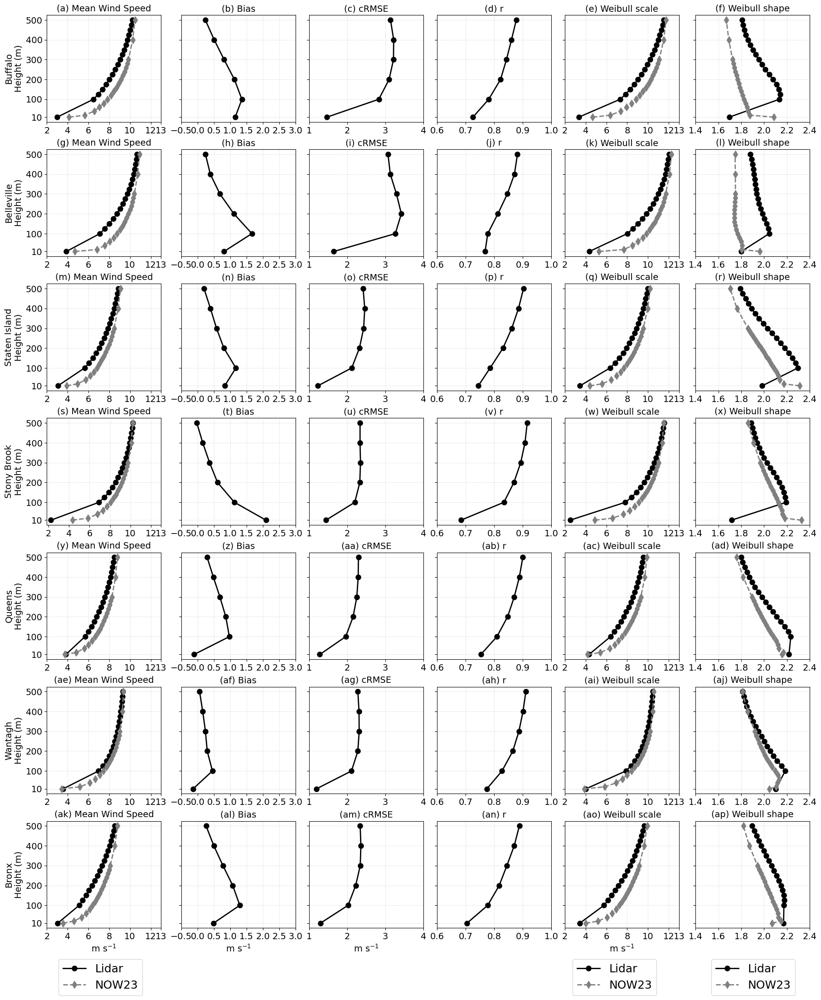

In [518]:
sites_type = coastal_sites
fig = plt.figure(figsize=(18,21), constrained_layout=True)
gs = fig.add_gridspec(len(sites_type),6)

chars = ['(a)', '(b)', '(c)', '(d)', '(e)','(f)','(g)','(h)','(i)','(j)','(k)','(l)',
         '(m)','(n)','(o)','(p)','(q)','(r)','(s)','(t)','(u)','(v)','(w)','(x)','(y)','(z)',
         '(aa)','(ab)','(ac)','(ad)','(ae)','(af)','(ag)','(ah)','(ai)','(aj)','(ak)','(al)',
         '(am)','(an)','(ao)','(ap)','(aq)','(ar)','(as)','(at)','(au)','(av)','(aw)','(ax)']
count = 0
for i,station_id in enumerate(sites_type):
    station_name = profilers[profilers['stid'] == station_id[5:]]['name'].values[0]
    xlabel = r'm s$^{-1}$' if i == len(sites_type)-1 else ''
    ax1 = fig.add_subplot(gs[i,0])
    data = conventional_statistics[station_id]['mean']['profiler']
    vertical_profile_plotter(ax1,data,data.levels,'Lidar',title=chars[count]+' Mean Wind Speed',
                                xlabel=xlabel,ylabel=f'{station_name}\nHeight (m)',xticks=[2,4,6,8,10,12],xtick_labels=True,yticks=[10,100,200,300,400,500],ytick_labels=True,fontsize=14,
                                linestyle='-',marker='o',color='k')
    data = conventional_statistics[station_id]['mean']['now']
    vertical_profile_plotter(ax1,data,data.levels,'NOW23',title=chars[count]+' Mean Wind Speed',
                                xlabel=xlabel,ylabel='',xticks=[2,4,6,8,10,12, 13],xtick_labels=True,yticks=[10,100,200,300,400,500],ytick_labels=True,fontsize=14,
                                linestyle='--',marker='d',color='gray')

    xlabel = r'm s$^{-1}$' if i == len(sites_type)-1 else ''
    ax2 = fig.add_subplot(gs[i,1])
    count += 1
    data = conventional_statistics[station_id]['bias']
    vertical_profile_plotter(ax2,data,data.levels,'',title=chars[count]+' Bias',
                                xlabel=xlabel,ylabel='',xticks=[-0.5,0, 0.5,1, 1.5, 2,2.5,3],xtick_labels=True,yticks=[10,100,200,300,400,500],ytick_labels=False,fontsize=14)

    xlabel = r'm s$^{-1}$' if i == len(sites_type)-1 else ''
    ax3 = fig.add_subplot(gs[i,2])
    count += 1
    data = conventional_statistics[station_id]['crmse']
    vertical_profile_plotter(ax3,data,data.levels,'',title=chars[count]+' cRMSE',
                                xlabel=xlabel,ylabel='',xticks=[1,2,3,4],xtick_labels=True,yticks=[10,100,200,300,400,500],ytick_labels=False,fontsize=14)

    xlabel = ''
    ax4 = fig.add_subplot(gs[i,3])
    count += 1
    data = conventional_statistics[station_id]['r']
    vertical_profile_plotter(ax4,data,data.levels,'',title=chars[count]+r' r',
                                xlabel=xlabel,ylabel='',xticks=[0.6,0.7,0.8,0.9,1],xtick_labels=True,yticks=[10,100,200,300,400,500],
                                ytick_labels=False,fontsize=14)

    xlabel = r'm s$^{-1}$' if i == len(sites_type)-1 else ''
    ax5 = fig.add_subplot(gs[i,4])
    count += 1
    data = conventional_statistics[station_id]['scale']['profiler']
    vertical_profile_plotter(ax5,data,data.levels,'Lidar',title=chars[count]+' Weibull scale',
                                xlabel=xlabel,ylabel='',xticks=[2,4,6,8,10,12,13],xtick_labels=True,yticks=[10,100,200,300,400,500],ytick_labels=False,fontsize=14,
                                linestyle='-',marker='o',color='k')
    data = conventional_statistics[station_id]['scale']['now']
    vertical_profile_plotter(ax5,data,data.levels,'NOW23',title=chars[count]+' Weibull scale',
                                xlabel=xlabel,ylabel='',xticks=[2,4,6,8,10,12,13],xtick_labels=True,yticks=[10,100,200,300,400,500],ytick_labels=False,fontsize=14,
                                linestyle='--',marker='d',color='gray')

    xlabel = ''
    ax6 = fig.add_subplot(gs[i,5])
    count += 1
    data = conventional_statistics[station_id]['shape']['profiler']
    vertical_profile_plotter(ax6,data,data.levels,'Lidar',title=chars[count]+' Weibull shape',
                                xlabel=xlabel,ylabel='',xticks=[1.4,1.6,1.8,2,2.2,2.4],xtick_labels=True,yticks=[10,100,200,300,400,500],ytick_labels=False,fontsize=14,
                                linestyle='-',marker='o',color='k')
    data = conventional_statistics[station_id]['shape']['now']
    vertical_profile_plotter(ax6,data,data.levels,'NOW23',title=chars[count]+' Weibull shape',
                                xlabel=xlabel,ylabel='',xticks=[1.4,1.6,1.8,2,2.2,2.4],xtick_labels=True,yticks=[10,100,200,300,400,500],ytick_labels=False,fontsize=14,
                                linestyle='--',marker='d',color='gray')
    count += 1
    # add grid lines
    for ax in [ax1, ax2, ax3, ax4, ax5, ax6]:
        ax.grid(True, which='major', axis='both', linestyle=':', linewidth=0.5)

# Extract legend from one of the subplots
handles, labels = ax1.get_legend_handles_labels()
# Create a common legend below the figures
fig.legend(handles, labels, loc='lower center', ncol=1, bbox_to_anchor=(0.12, -0.048),fontsize=18)

# Extract legend from one of the subplots
handles, labels = ax5.get_legend_handles_labels()
# Create a common legend below the figures
fig.legend(handles, labels, loc='lower center', ncol=1, bbox_to_anchor=(0.75, -0.048),fontsize=18)

# Extract legend from one of the subplots
handles, labels = ax6.get_legend_handles_labels()
# Create a common legend below the figures
fig.legend(handles, labels, loc='lower center', ncol=1, bbox_to_anchor=(0.92, -0.048),fontsize=18)

plt.savefig(f'{FIGDIR}/Coastal_Sites_Conventional_Statistics_profiles.pdf', dpi=300, bbox_inches='tight')

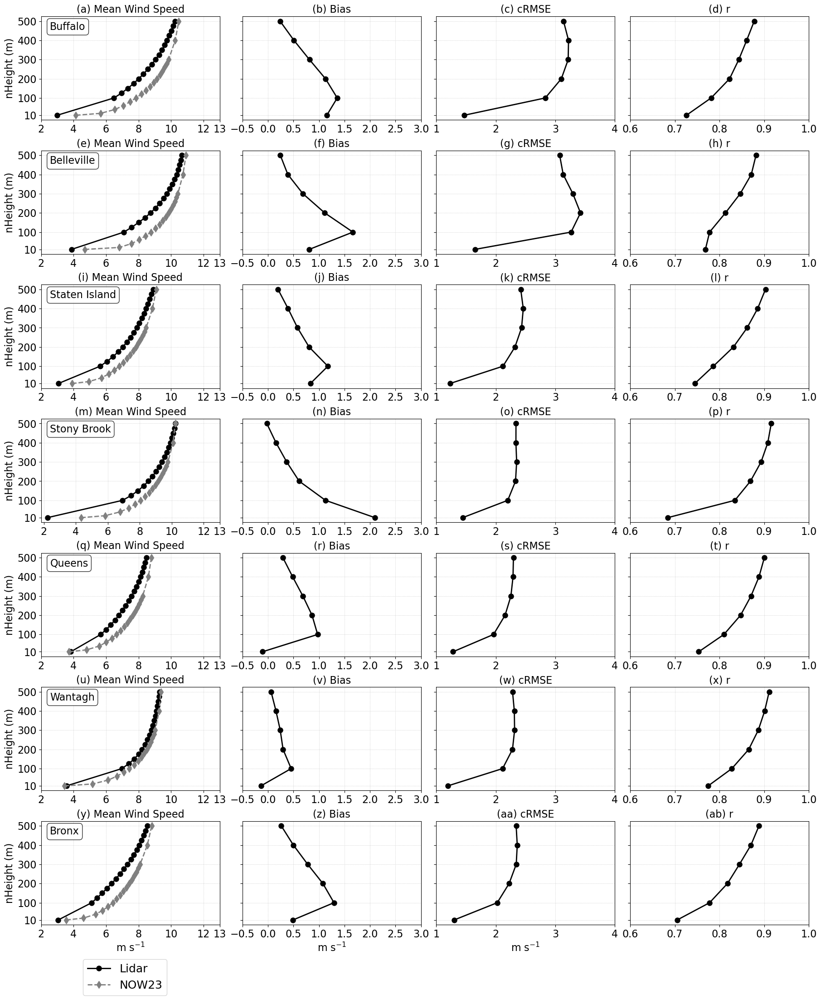

In [116]:
# without weibull
sites_type = coastal_sites
fig = plt.figure(figsize=(18,21), constrained_layout=True)
gs = fig.add_gridspec(len(sites_type),4)
fontsize=16
chars = ['(a)', '(b)', '(c)', '(d)', '(e)','(f)','(g)','(h)','(i)','(j)','(k)','(l)',
         '(m)','(n)','(o)','(p)','(q)','(r)','(s)','(t)','(u)','(v)','(w)','(x)','(y)','(z)',
         '(aa)','(ab)','(ac)','(ad)','(ae)','(af)','(ag)','(ah)','(ai)','(aj)','(ak)','(al)',
         '(am)','(an)','(ao)','(ap)','(aq)','(ar)','(as)','(at)','(au)','(av)','(aw)','(ax)']
count = 0
for i,station_id in enumerate(sites_type):
    station_name = profilers[profilers['stid'] == station_id[5:]]['name'].values[0]
    xlabel = r'm s$^{-1}$' if i == len(sites_type)-1 else ''
    ax1 = fig.add_subplot(gs[i,0])
    data = conventional_statistics[station_id]['mean']['profiler']
    vertical_profile_plotter(ax1,data,data.levels,'Lidar',title=chars[count]+' Mean Wind Speed',
                                xlabel=xlabel,ylabel=f'nHeight (m)',xticks=[2,4,6,8,10,12],xtick_labels=True,yticks=[10,100,200,300,400,500],ytick_labels=True,
                                fontsize=fontsize,
                                linestyle='-',marker='o',color='k',
                                text_loc=[0.05,0.95],text=station_name)
    data = conventional_statistics[station_id]['mean']['now']
    vertical_profile_plotter(ax1,data,data.levels,'NOW23',title=chars[count]+' Mean Wind Speed',
                                xlabel=xlabel,ylabel='',xticks=[2,4,6,8,10,12, 13],xtick_labels=True,yticks=[10,100,200,300,400,500],ytick_labels=True,
                                fontsize=fontsize,
                                linestyle='--',marker='d',color='gray')

    xlabel = r'm s$^{-1}$' if i == len(sites_type)-1 else ''
    ax2 = fig.add_subplot(gs[i,1])
    count += 1
    data = conventional_statistics[station_id]['bias']
    vertical_profile_plotter(ax2,data,data.levels,'',title=chars[count]+' Bias',
                                xlabel=xlabel,ylabel='',xticks=[-0.5,0, 0.5,1, 1.5, 2,2.5,3],xtick_labels=True,
                                yticks=[10,100,200,300,400,500],ytick_labels=False,fontsize=fontsize)

    xlabel = r'm s$^{-1}$' if i == len(sites_type)-1 else ''
    ax3 = fig.add_subplot(gs[i,2])
    count += 1
    data = conventional_statistics[station_id]['crmse']
    vertical_profile_plotter(ax3,data,data.levels,'',title=chars[count]+' cRMSE',
                                xlabel=xlabel,ylabel='',xticks=[1,2,3,4],xtick_labels=True,yticks=[10,100,200,300,400,500],ytick_labels=False,fontsize=fontsize)

    xlabel = ''
    ax4 = fig.add_subplot(gs[i,3])
    count += 1
    data = conventional_statistics[station_id]['r']
    vertical_profile_plotter(ax4,data,data.levels,'',title=chars[count]+r' r',
                                xlabel=xlabel,ylabel='',xticks=[0.6,0.7,0.8,0.9,1],xtick_labels=True,yticks=[10,100,200,300,400,500],
                                ytick_labels=False,fontsize=fontsize)

    '''
    xlabel = r'm s$^{-1}$' if i == len(sites_type)-1 else ''
    ax5 = fig.add_subplot(gs[i,4])
    count += 1
    data = conventional_statistics[station_id]['scale']['profiler']
    vertical_profile_plotter(ax5,data,data.levels,'Lidar',title=chars[count]+' Weibull scale',
                                xlabel=xlabel,ylabel='',xticks=[2,4,6,8,10,12,13],xtick_labels=True,yticks=[10,100,200,300,400,500],ytick_labels=False,fontsize=14,
                                linestyle='-',marker='o',color='k')
    data = conventional_statistics[station_id]['scale']['now']
    vertical_profile_plotter(ax5,data,data.levels,'NOW23',title=chars[count]+' Weibull scale',
                                xlabel=xlabel,ylabel='',xticks=[2,4,6,8,10,12,13],xtick_labels=True,yticks=[10,100,200,300,400,500],ytick_labels=False,fontsize=14,
                                linestyle='--',marker='d',color='gray')

    xlabel = ''
    ax6 = fig.add_subplot(gs[i,5])
    count += 1
    data = conventional_statistics[station_id]['shape']['profiler']
    vertical_profile_plotter(ax6,data,data.levels,'Lidar',title=chars[count]+' Weibull shape',
                                xlabel=xlabel,ylabel='',xticks=[1.4,1.6,1.8,2,2.2,2.4],xtick_labels=True,yticks=[10,100,200,300,400,500],ytick_labels=False,fontsize=14,
                                linestyle='-',marker='o',color='k')
    data = conventional_statistics[station_id]['shape']['now']
    vertical_profile_plotter(ax6,data,data.levels,'NOW23',title=chars[count]+' Weibull shape',
                                xlabel=xlabel,ylabel='',xticks=[1.4,1.6,1.8,2,2.2,2.4],xtick_labels=True,yticks=[10,100,200,300,400,500],ytick_labels=False,fontsize=14,
                                linestyle='--',marker='d',color='gray')
    '''
    count += 1
    # add grid lines
    for ax in [ax1, ax2, ax3, ax4]:
        ax.grid(True, which='major', axis='both', linestyle=':', linewidth=0.5)

# Extract legend from one of the subplots
handles, labels = ax1.get_legend_handles_labels()
# Create a common legend below the figures
fig.legend(handles, labels, loc='lower center', ncol=1, bbox_to_anchor=(0.15, -0.048),fontsize=18)

plt.savefig(f'{FIGDIR}/Coastal_Sites_Conventional_Statistics_profiles_without_weibull.pdf', dpi=300, bbox_inches='tight')

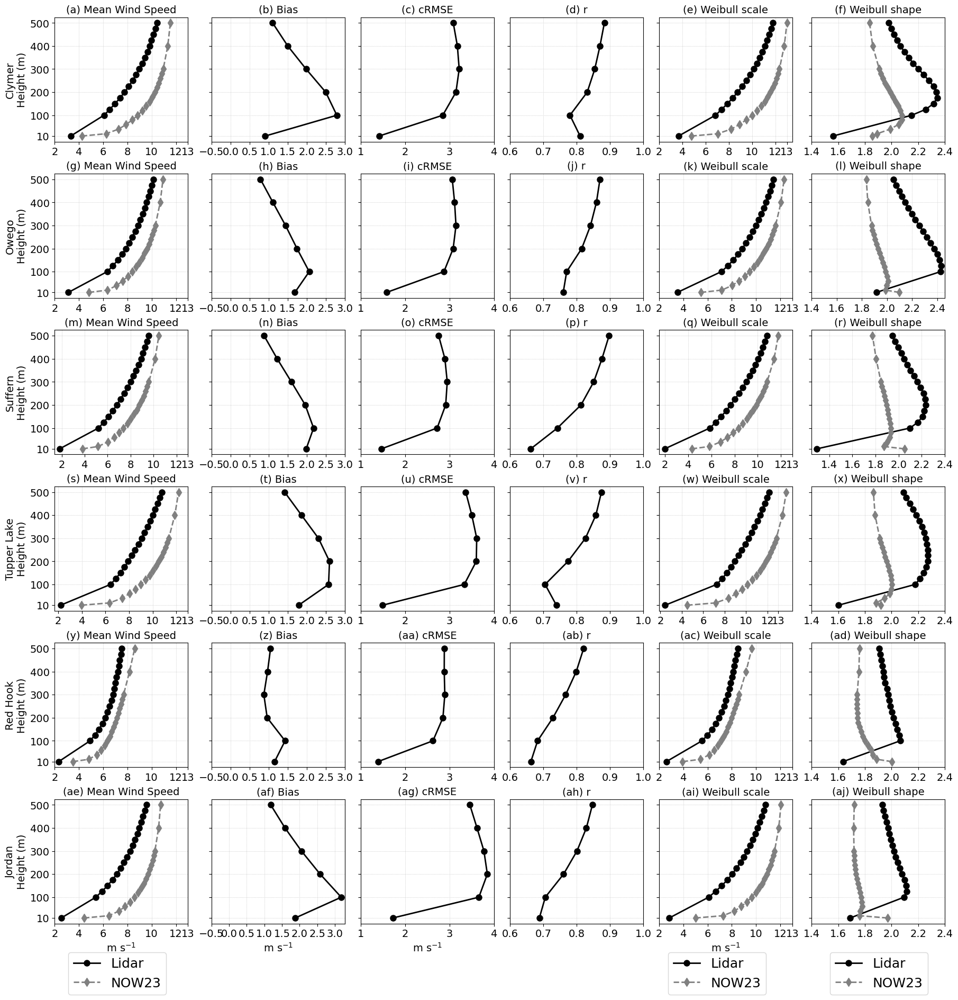

In [519]:
sites_type = inland_sites
fig = plt.figure(figsize=(18,18), constrained_layout=True)
gs = fig.add_gridspec(len(sites_type),6)

chars = ['(a)', '(b)', '(c)', '(d)', '(e)','(f)','(g)','(h)','(i)','(j)','(k)','(l)',
         '(m)','(n)','(o)','(p)','(q)','(r)','(s)','(t)','(u)','(v)','(w)','(x)','(y)','(z)',
         '(aa)','(ab)','(ac)','(ad)','(ae)','(af)','(ag)','(ah)','(ai)','(aj)','(ak)','(al)',
         '(am)','(an)','(ao)','(ap)','(aq)','(ar)','(as)','(at)','(au)','(av)','(aw)','(ax)']
count = 0
for i,station_id in enumerate(sites_type):
    station_name = profilers[profilers['stid'] == station_id[5:]]['name'].values[0]
    xlabel = r'm s$^{-1}$' if i == len(sites_type)-1 else ''
    ax1 = fig.add_subplot(gs[i,0])
    data = conventional_statistics[station_id]['mean']['profiler']
    vertical_profile_plotter(ax1,data,data.levels,'Lidar',title=chars[count]+' Mean Wind Speed',
                                xlabel=xlabel,ylabel=f'{station_name}\nHeight (m)',xticks=[2,4,6,8,10,12],xtick_labels=True,yticks=[10,100,200,300,400,500],ytick_labels=True,fontsize=14,
                                linestyle='-',marker='o',color='k')
    data = conventional_statistics[station_id]['mean']['now']
    vertical_profile_plotter(ax1,data,data.levels,'NOW23',title=chars[count]+' Mean Wind Speed',
                                xlabel=xlabel,ylabel='',xticks=[2,4,6,8,10,12,13],xtick_labels=True,yticks=[10,100,200,300,400,500],ytick_labels=True,fontsize=14,
                                linestyle='--',marker='d',color='gray')

    xlabel = r'm s$^{-1}$' if i == len(sites_type)-1 else ''
    ax2 = fig.add_subplot(gs[i,1])
    count += 1
    data = conventional_statistics[station_id]['bias']
    vertical_profile_plotter(ax2,data,data.levels,'',title=chars[count]+' Bias',
                                xlabel=xlabel,ylabel='',xticks=[-0.5,0, 0.5,1, 1.5, 2,2.5,3],xtick_labels=True,yticks=[10,100,200,300,400,500],ytick_labels=False,fontsize=14)

    xlabel = r'm s$^{-1}$' if i == len(sites_type)-1 else ''
    ax3 = fig.add_subplot(gs[i,2])
    count += 1
    data = conventional_statistics[station_id]['crmse']
    vertical_profile_plotter(ax3,data,data.levels,'',title=chars[count]+' cRMSE',
                                xlabel=xlabel,ylabel='',xticks=[1,2,3,4],xtick_labels=True,yticks=[10,100,200,300,400,500],ytick_labels=False,fontsize=14)

    xlabel = ''
    ax4 = fig.add_subplot(gs[i,3])
    count += 1
    data = conventional_statistics[station_id]['r']
    vertical_profile_plotter(ax4,data,data.levels,'',title=chars[count]+r' r',
                                xlabel=xlabel,ylabel='',xticks=[0.6,0.7,0.8,0.9,1],xtick_labels=True,yticks=[10,100,200,300,400,500],
                                ytick_labels=False,fontsize=14)

    xlabel = r'm s$^{-1}$' if i == len(sites_type)-1 else ''
    ax5 = fig.add_subplot(gs[i,4])
    count += 1
    data = conventional_statistics[station_id]['scale']['profiler']
    vertical_profile_plotter(ax5,data,data.levels,'Lidar',title=chars[count]+' Weibull scale',
                                xlabel=xlabel,ylabel='',xticks=[2,4,6,8,10,12,13],xtick_labels=True,yticks=[10,100,200,300,400,500],ytick_labels=False,fontsize=14,
                                linestyle='-',marker='o',color='k')
    data = conventional_statistics[station_id]['scale']['now']
    vertical_profile_plotter(ax5,data,data.levels,'NOW23',title=chars[count]+' Weibull scale',
                                xlabel=xlabel,ylabel='',xticks=[2,4,6,8,10,12,13],xtick_labels=True,yticks=[10,100,200,300,400,500],ytick_labels=False,fontsize=14,
                                linestyle='--',marker='d',color='gray')

    xlabel = ''
    ax6 = fig.add_subplot(gs[i,5])
    count += 1
    data = conventional_statistics[station_id]['shape']['profiler']
    vertical_profile_plotter(ax6,data,data.levels,'Lidar',title=chars[count]+' Weibull shape',
                                xlabel=xlabel,ylabel='',xticks=[1.4,1.6,1.8,2,2.2,2.4],xtick_labels=True,yticks=[10,100,200,300,400,500],ytick_labels=False,fontsize=14,
                                linestyle='-',marker='o',color='k')
    data = conventional_statistics[station_id]['shape']['now']
    vertical_profile_plotter(ax6,data,data.levels,'NOW23',title=chars[count]+' Weibull shape',
                                xlabel=xlabel,ylabel='',xticks=[1.4,1.6,1.8,2,2.2,2.4],xtick_labels=True,yticks=[10,100,200,300,400,500],ytick_labels=False,fontsize=14,
                                linestyle='--',marker='d',color='gray')
    count += 1
    # add grid lines
    for ax in [ax1, ax2, ax3, ax4, ax5, ax6]:
        ax.grid(True, which='major', axis='both', linestyle=':', linewidth=0.5)

# Extract legend from one of the subplots
handles, labels = ax1.get_legend_handles_labels()
# Create a common legend below the figures
fig.legend(handles, labels, loc='lower center', ncol=1, bbox_to_anchor=(0.12, -0.048),fontsize=18)

# Extract legend from one of the subplots
handles, labels = ax5.get_legend_handles_labels()
# Create a common legend below the figures
fig.legend(handles, labels, loc='lower center', ncol=1, bbox_to_anchor=(0.75, -0.048),fontsize=18)

# Extract legend from one of the subplots
handles, labels = ax6.get_legend_handles_labels()
# Create a common legend below the figures
fig.legend(handles, labels, loc='lower center', ncol=1, bbox_to_anchor=(0.92, -0.048),fontsize=18)

plt.savefig(f'{FIGDIR}/Inland_Sites_Conventional_Statistics_profiles.pdf', dpi=300, bbox_inches='tight')

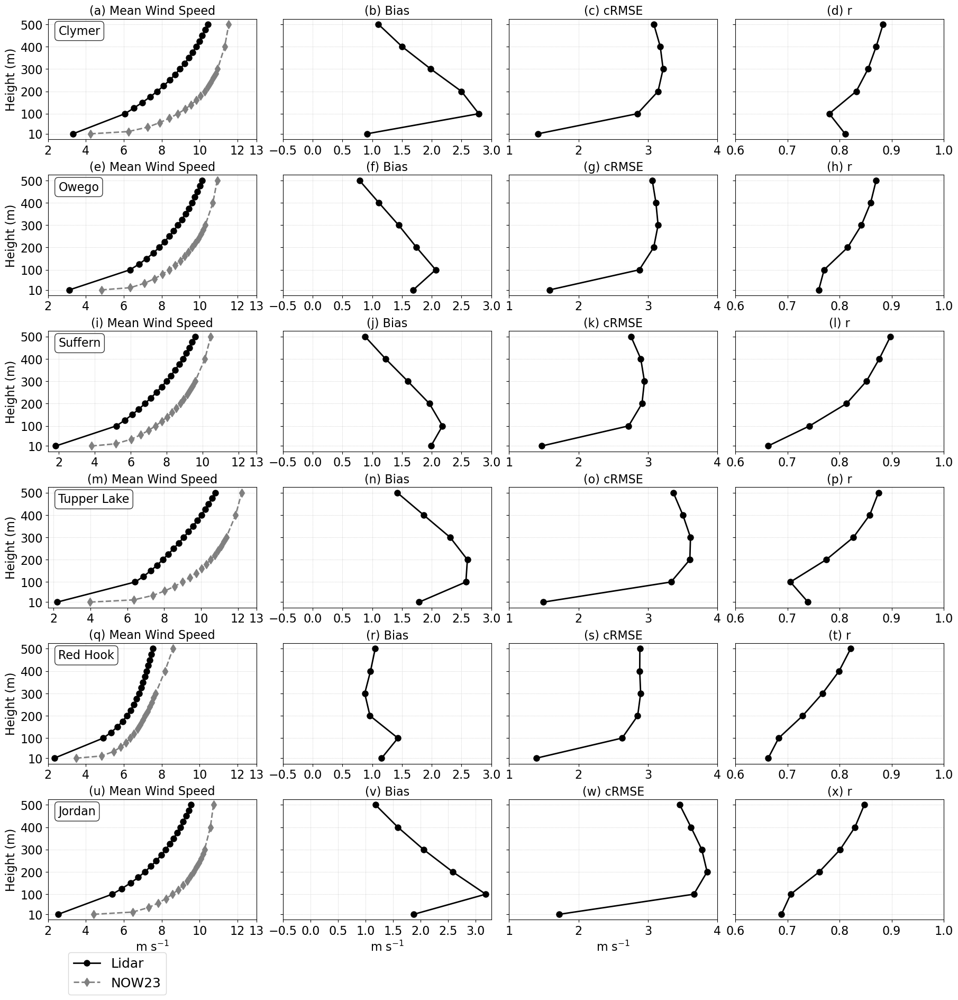

In [117]:
#without weibull
sites_type = inland_sites
fig = plt.figure(figsize=(18,18), constrained_layout=True)
gs = fig.add_gridspec(len(sites_type),4)
fontsize=16

chars = ['(a)', '(b)', '(c)', '(d)', '(e)','(f)','(g)','(h)','(i)','(j)','(k)','(l)',
         '(m)','(n)','(o)','(p)','(q)','(r)','(s)','(t)','(u)','(v)','(w)','(x)','(y)','(z)',
         '(aa)','(ab)','(ac)','(ad)','(ae)','(af)','(ag)','(ah)','(ai)','(aj)','(ak)','(al)',
         '(am)','(an)','(ao)','(ap)','(aq)','(ar)','(as)','(at)','(au)','(av)','(aw)','(ax)']
count = 0
for i,station_id in enumerate(sites_type):
    station_name = profilers[profilers['stid'] == station_id[5:]]['name'].values[0]
    xlabel = r'm s$^{-1}$' if i == len(sites_type)-1 else ''
    ax1 = fig.add_subplot(gs[i,0])
    data = conventional_statistics[station_id]['mean']['profiler']
    vertical_profile_plotter(ax1,data,data.levels,'Lidar',title=chars[count]+' Mean Wind Speed',
                                xlabel=xlabel,ylabel=f'Height (m)',xticks=[2,4,6,8,10,12],xtick_labels=True,yticks=[10,100,200,300,400,500],ytick_labels=True,
                                fontsize=fontsize,
                                linestyle='-',marker='o',color='k', text_loc=[0.05,0.95],text=station_name)
    data = conventional_statistics[station_id]['mean']['now']
    vertical_profile_plotter(ax1,data,data.levels,'NOW23',title=chars[count]+' Mean Wind Speed',
                                xlabel=xlabel,ylabel='',xticks=[2,4,6,8,10,12,13],xtick_labels=True,yticks=[10,100,200,300,400,500],
                                ytick_labels=True,fontsize=fontsize,
                                linestyle='--',marker='d',color='gray')

    xlabel = r'm s$^{-1}$' if i == len(sites_type)-1 else ''
    ax2 = fig.add_subplot(gs[i,1])
    count += 1
    data = conventional_statistics[station_id]['bias']
    vertical_profile_plotter(ax2,data,data.levels,'',title=chars[count]+' Bias',
                                xlabel=xlabel,ylabel='',xticks=[-0.5,0, 0.5,1, 1.5, 2,2.5,3],xtick_labels=True,
                                yticks=[10,100,200,300,400,500],ytick_labels=False,fontsize=fontsize)

    xlabel = r'm s$^{-1}$' if i == len(sites_type)-1 else ''
    ax3 = fig.add_subplot(gs[i,2])
    count += 1
    data = conventional_statistics[station_id]['crmse']
    vertical_profile_plotter(ax3,data,data.levels,'',title=chars[count]+' cRMSE',
                                xlabel=xlabel,ylabel='',xticks=[1,2,3,4],xtick_labels=True,yticks=[10,100,200,300,400,500],
                                ytick_labels=False,fontsize=fontsize)

    xlabel = ''
    ax4 = fig.add_subplot(gs[i,3])
    count += 1
    data = conventional_statistics[station_id]['r']
    vertical_profile_plotter(ax4,data,data.levels,'',title=chars[count]+r' r',
                                xlabel=xlabel,ylabel='',xticks=[0.6,0.7,0.8,0.9,1],xtick_labels=True,yticks=[10,100,200,300,400,500],
                                ytick_labels=False,fontsize=fontsize)
    '''
    xlabel = r'm s$^{-1}$' if i == len(sites_type)-1 else ''
    ax5 = fig.add_subplot(gs[i,4])
    count += 1
    data = conventional_statistics[station_id]['scale']['profiler']
    vertical_profile_plotter(ax5,data,data.levels,'Lidar',title=chars[count]+' Weibull scale',
                                xlabel=xlabel,ylabel='',xticks=[2,4,6,8,10,12,13],xtick_labels=True,yticks=[10,100,200,300,400,500],ytick_labels=False,fontsize=14,
                                linestyle='-',marker='o',color='k')
    data = conventional_statistics[station_id]['scale']['now']
    vertical_profile_plotter(ax5,data,data.levels,'NOW23',title=chars[count]+' Weibull scale',
                                xlabel=xlabel,ylabel='',xticks=[2,4,6,8,10,12,13],xtick_labels=True,yticks=[10,100,200,300,400,500],ytick_labels=False,fontsize=14,
                                linestyle='--',marker='d',color='gray')

    xlabel = ''
    ax6 = fig.add_subplot(gs[i,5])
    count += 1
    data = conventional_statistics[station_id]['shape']['profiler']
    vertical_profile_plotter(ax6,data,data.levels,'Lidar',title=chars[count]+' Weibull shape',
                                xlabel=xlabel,ylabel='',xticks=[1.4,1.6,1.8,2,2.2,2.4],xtick_labels=True,yticks=[10,100,200,300,400,500],ytick_labels=False,fontsize=14,
                                linestyle='-',marker='o',color='k')
    data = conventional_statistics[station_id]['shape']['now']
    vertical_profile_plotter(ax6,data,data.levels,'NOW23',title=chars[count]+' Weibull shape',
                                xlabel=xlabel,ylabel='',xticks=[1.4,1.6,1.8,2,2.2,2.4],xtick_labels=True,yticks=[10,100,200,300,400,500],ytick_labels=False,fontsize=14,
                                linestyle='--',marker='d',color='gray')
    '''
    count += 1
    # add grid lines
    for ax in [ax1, ax2, ax3, ax4]:
        ax.grid(True, which='major', axis='both', linestyle=':', linewidth=0.5)

# Extract legend from one of the subplots
handles, labels = ax1.get_legend_handles_labels()
# Create a common legend below the figures
fig.legend(handles, labels, loc='lower center', ncol=1, bbox_to_anchor=(0.12, -0.048),fontsize=18)
'''
# Extract legend from one of the subplots
handles, labels = ax5.get_legend_handles_labels()
# Create a common legend below the figures
fig.legend(handles, labels, loc='lower center', ncol=1, bbox_to_anchor=(0.75, -0.048),fontsize=18)

# Extract legend from one of the subplots
handles, labels = ax6.get_legend_handles_labels()
# Create a common legend below the figures
fig.legend(handles, labels, loc='lower center', ncol=1, bbox_to_anchor=(0.92, -0.048),fontsize=18)
'''
plt.savefig(f'{FIGDIR}/Inland_Sites_Conventional_Statistics_profiles_without_weibull.pdf', dpi=300, bbox_inches='tight')

## Stationwise Chebyshev coefficient statistics

In [ ]:
import pandas as pd
from collections import defaultdict

# Define height levels and station IDs
station_ids = ['PROF_CLYM','PROF_OWEG','PROF_SUFF','PROF_BUFF','PROF_BELL','PROF_TUPP','PROF_REDH','PROF_JORD',
                    'PROF_STON','PROF_BRON','PROF_STAT','PROF_QUEE','PROF_WANT']


# Create a dictionary to hold combined Weibull parameters for each station and height level
data = defaultdict(list)

# Loop through each station and height level to gather Weibull coefficients
for station_id in station_ids:
    data[('Station', '')].append(station_id[5:])  # Use tuple ('Station', '') to match multi-level columns

    for coeff in range(5):
        # Extract profiler and NOW23 data for the specified height and remove NaNs
        prof_values = profiler_coeff_all[station_id].sel(coeff=coeff).values
        now_values = NOW23_coeff_all[station_id].sel(coeff=coeff).values
        
        # Calculate R2, MAE, and RMSE
        R2_val = R2(prof_values, now_values)
        MAE_val = mae(prof_values, now_values)
        RMSE_val = np.sqrt(mse(prof_values, now_values))
        
        # Append to data dictionary for each height's shape and scale values
        data[(f'C{coeff}', r'$R^2$')].append(f"{R2_val:.2f}")
        data[(f'C{coeff}', 'MAE')].append(f"{MAE_val:.2f}")
        data[(f'C{coeff}', 'RMSE')].append(f"{RMSE_val:.2f}")

# Convert dictionary to DataFrame with MultiIndex columns
df_stats = pd.DataFrame(data)

# Set MultiIndex for columns
df_stats.columns = pd.MultiIndex.from_tuples(df_stats.columns)
    

## Chebyshev comparison

In [96]:
def hexbin_plotter(ax_hexbin, Y, pred, title, text_arg=None, text_loc=None, errors_to_show=[r'$R^2$', 'RMSE', 'MAE'], err_units=None,
                   xlabel=None, ylabel=None, xlims=None, ylims=None, colorbar=None, fontsize=14,xticks=None,yticks=None):
    '''
    Plots hexbin between true and predictions of Y
    fig: figure handle
    gs: grid spec handle
    Y: target (train or test or true) 
    pred: prediction from a model
    title: title of the figure
    text_arg: whether to add text within the plot or not
    xlabel_arg: some cases, the xlabel is not needed, this specifies that
    ylabel_arg: some cases, the ylabel is not needed, this specifies that 
    fontsize: font size for labels, title, and text
    '''
    # Calculate error metrics
    err_metrics = {
        'Bias': np.mean(pred)-np.mean(Y),
        'MAE': mae(Y, pred),
        'RMSE': np.sqrt(mse(Y, pred)),
        'cRMSE': centered_rmse(Y, pred),
        'MAPE': mape(Y, pred) * 100,
        r'$R^2$': R2(Y, pred),
        'r': np.corrcoef(np.squeeze(Y), np.squeeze(pred))[0, 1]
    }

    hb = ax_hexbin.hexbin(np.squeeze(Y), np.squeeze(pred), gridsize=100, bins='log', cmap='inferno')

    if text_arg:
        error_lines = []
        for error in errors_to_show:
            if error in err_metrics:
                if error == r'$R^2$':
                    error_lines.append(f'{error:<7}: {err_metrics[error]:>4.2f} {err_units[error]}')  # Adjusted spacing
                else:
                    error_lines.append(f'{error:<4}: {err_metrics[error]:>4.2f} {err_units[error]}')
        error_text = '\n'.join(error_lines)

        ax_hexbin.text(text_loc[0], text_loc[1], error_text, transform=ax_hexbin.transAxes, verticalalignment='top',
                       bbox=dict(boxstyle='round', facecolor='white', alpha=0.8), fontfamily='monospace', fontsize=fontsize)

    # Apply fontsize to labels and title
    if xlabel:
        ax_hexbin.set_xlabel(xlabel, fontsize=fontsize)
    if ylabel:
        ax_hexbin.set_ylabel(ylabel, fontsize=fontsize)
    if xticks is None:
        ax_hexbin.set_xticks([])
    if yticks is None:
        ax_hexbin.set_yticks([])
    ax_hexbin.set_title(f'{title}', fontsize=fontsize)  # Slightly larger title

    ax_hexbin.tick_params(axis='both', which='major', labelsize=fontsize)

    # Adjust axis limits and add reference line
    if xlims and ylims:
        ax_hexbin.set_xlim(xlims[0], xlims[1])
        ax_hexbin.set_ylim(ylims[0], ylims[1])
        ax_hexbin.plot([xlims[0], xlims[1]], [ylims[0], ylims[1]], 'k--')
    else:
        min_value = Y.min()
        max_value = Y.max()
        ax_hexbin.set_xlim(min_value, max_value)
        ax_hexbin.set_ylim(min_value, max_value)
        ax_hexbin.plot([min_value, max_value], [min_value, max_value], 'k--')

    return hb

In [10]:
# combine the coefficient data
profiler_coeff_combined = xr.concat([profiler_coeff_all[station_id] for station_id in test_station_ids], dim='time')
NOW23_coeff_combined = xr.concat([NOW23_coeff_all[station_id] for station_id in test_station_ids], dim='time')

In [155]:
coeff = 2
profile_data = profiler_coeff_combined.sel(coeff=coeff)
quantiles = profile_data.quantile([0.0001, 0.9999], dim='time')
# Create a mask of valid (non-outlier) times
mask = (profile_data > quantiles.sel(quantile=0.0001)) & (profile_data < quantiles.sel(quantile=0.9999))

# Retain original shape with NaNs for outliers
profile_data_masked = profile_data.where(mask, drop=True)

# Apply same mask to NOW23
now23_data = NOW23_coeff_combined.sel(coeff=coeff)
now23_data_masked = now23_data.where(mask, drop=True)

In [12]:
from matplotlib.patches import Ellipse
# Function to calculate and plot bivariate ellipse
def plot_bivariate_ellipse(ax, x_data, y_data, n_std=3.0, **kwargs):
    # Calculate covariance and mean
    cov = np.cov(x_data, y_data)
    mean = [np.mean(x_data), np.mean(y_data)]
    
    # Eigenvalues and eigenvectors of covariance matrix
    eigvals, eigvecs = np.linalg.eigh(cov)
    
    # Get the angle for the ellipse orientation
    angle = np.degrees(np.arctan2(*eigvecs[:, 0][::-1]))
    
    # Width and height of ellipse based on eigenvalues. Here, we multiply by n_std to get the full width and height
    width, height = 2 * n_std * np.sqrt(eigvals)
    
    # Create and add the ellipse patch to the axes
    ellipse = Ellipse(xy=mean, width=width, height=height, angle=angle, **kwargs)
    ax.add_patch(ellipse)

Coefficient 0: Bias = 1.06, R = 0.87, cRMSE = 2.27, EMD: 1.07
Coefficient 1: Bias = -0.32, R = 0.81, cRMSE = 1.46, EMD: 0.35
Coefficient 2: Bias = -0.21, R = 0.47, cRMSE = 1.04, EMD: 0.21
Coefficient 3: Bias = 0.18, R = 0.22, cRMSE = 0.64, EMD: 0.18
Coefficient 4: Bias = -0.12, R = 0.12, cRMSE = 0.39, EMD: 0.12


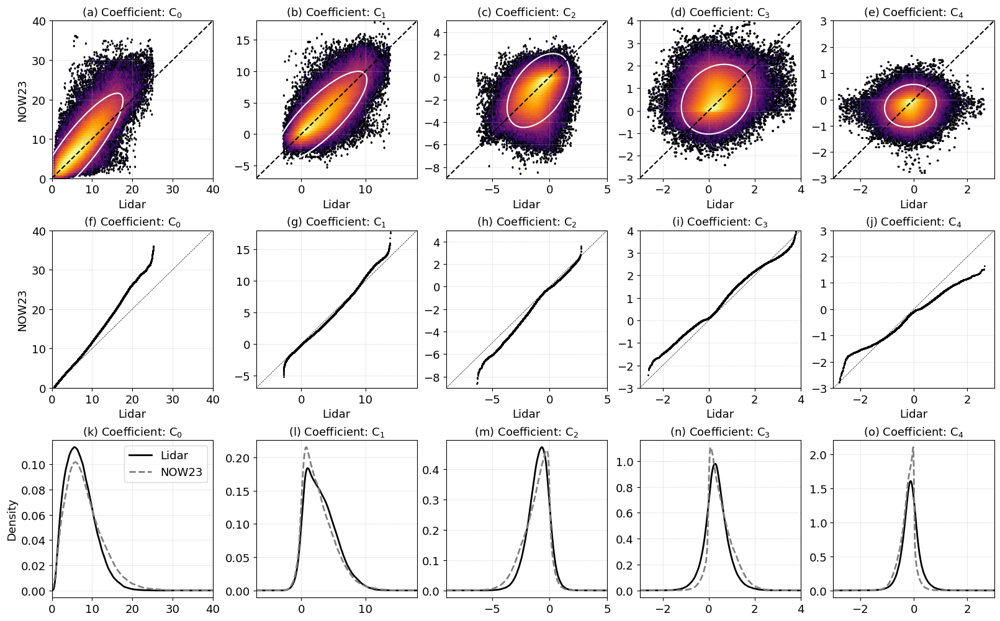

In [97]:
LIMS = [[0,40],[-7,18],[-9,5],[-3,4],[-3,3]]
errors_to_show = ['Bias','cRMSE','r']
err_units = {
    'Bias': '',
    'cRMSE': '',
    'r': ''
}
fontsize = 13
fig = plt.figure(figsize=(16, 15), constrained_layout=True)
gs = fig.add_gridspec(5,5)
alphabets = ['(a)','(b)','(c)','(d)','(e)','(f)','(g)','(h)','(i)','(j)','(k)','(l)','(m)','(n)','(o)','(p)','(q)','(r)','(s)','(t)','(u)','(v)','(w)','(x)','(y)','(z)']
for coeff in range(5):

    profile_data = profiler_coeff_combined.sel(coeff=coeff)
    quantiles = profile_data.quantile([0.0001, 0.9999], dim='time')
    # Create a mask of valid (non-outlier) times
    mask = (profile_data > quantiles.sel(quantile=0.0001)) & (profile_data < quantiles.sel(quantile=0.9999))
    # Retain original shape with NaNs for outliers
    profile_data_masked = profile_data.where(mask, drop=True)
    # Apply same mask to NOW23
    now23_data = NOW23_coeff_combined.sel(coeff=coeff)
    now23_data_masked = now23_data.where(mask, drop=True)

    ylabel = f'NOW23' if coeff == 0 else ''
    xlabel = 'Lidar' 
    title = fr'{alphabets[coeff]} Coefficient: C$_{coeff}$'

    row, col = 0,coeff
    xlims = LIMS[coeff]
    ylims = LIMS[coeff]
    text_loc = [0.05, 0.95] if coeff == 1 else [0.55, 0.25]
    ax = fig.add_subplot(gs[row,col])

    bias_val = now23_data_masked.mean(dim='time') - profile_data_masked.mean(dim='time')
    r_val = xr.apply_ufunc(correlation_coefficient, profile_data_masked, now23_data_masked,input_core_dims=[["time"], ["time"]],vectorize=True,)
    cRMSE_val = xr.apply_ufunc(centered_rmse, profile_data_masked, now23_data_masked,input_core_dims=[["time"], ["time"]],vectorize=True,)
    emd = wd(profile_data_masked, now23_data_masked)

    print(f'Coefficient {coeff}: Bias = {bias_val.values:.2f}, R = {r_val.values:.2f}, cRMSE = {cRMSE_val.values:.2f}, EMD: {emd:.2f}')
    
    hexbin_plotter(ax,profile_data_masked,
                now23_data_masked,
                title,text_arg=False, text_loc = None,
                xlabel=xlabel, ylabel=ylabel,errors_to_show=errors_to_show,err_units=err_units,
                xlims=xlims, ylims=ylims, fontsize=fontsize,xticks=True,yticks=True)
    
    # Plot bivariate ellipse
    plot_bivariate_ellipse(ax, np.squeeze(profile_data_masked), np.squeeze(now23_data_masked), edgecolor='white', facecolor='none', linewidth=1.5)
    ax.grid(True, which='major', axis='both', linestyle=':', linewidth=0.5)

    row, col = 1,coeff
    ax = fig.add_subplot(gs[row,col])
    ax.plot(np.sort(profile_data_masked),
                        np.sort(now23_data_masked),'.k',label=station_id[5:], markersize=2)
    min_value = LIMS[coeff][0]
    max_value = LIMS[coeff][1]
    ax.set_xlim(min_value, max_value)
    ax.set_ylim(min_value, max_value)
    ax.plot([min_value, max_value], [min_value, max_value], 'k--',linewidth=0.5)

    ax.set_xlabel(xlabel, fontsize=fontsize)
    ax.set_ylabel(ylabel, fontsize=fontsize)
    title = fr'{alphabets[coeff+5]} Coefficient: C$_{coeff}$'
    ax.set_title(title, fontsize=fontsize)
    ax.tick_params(axis='both', which='major', labelsize=fontsize)
    ax.grid(True, which='major', axis='both', linestyle=':', linewidth=0.5)

    row, col = 2,coeff
    ax = fig.add_subplot(gs[row,col])
    #ax.hist(profile_data_masked, bins=100, color='k', label='Lidar')
    #ax.hist(now23_data_masked, bins=100, color='gray', alpha=0.7, label='NOW23')

    # Define range for KDE plots
    x_grid = np.linspace(LIMS[coeff][0], LIMS[coeff][1], 500)

    # Compute KDE
    from scipy.stats import gaussian_kde
    kde_lidar = gaussian_kde(profile_data_masked)
    kde_now23 = gaussian_kde(now23_data_masked)

    # Plot KDE curves
    ax.plot(x_grid, kde_lidar(x_grid), color='k', label='Lidar', linewidth=2)
    ax.plot(x_grid, kde_now23(x_grid), color='gray', linestyle='--', label='NOW23', linewidth=2)

    ylabel = 'Density' if coeff == 0 else ''
    ax.set_ylabel(ylabel, fontsize=fontsize)
    ax.tick_params(axis='both', which='major', labelsize=fontsize)
    ax.set_xlim(LIMS[coeff])
    title = fr'{alphabets[coeff+10]} Coefficient: C$_{coeff}$'
    ax.set_title(title, fontsize=fontsize)
    ax.legend(fontsize=fontsize) if coeff == 0 else None
    ax.grid(True, which='major', axis='both', linestyle=':', linewidth=0.5)

plt.savefig(f'{FIGDIR}/Coefficients_combined_hexbin_Q-Q_KDE_Comparison.png', dpi=300, bbox_inches='tight')


## Q-Q plots of coefficients, at quantile ranges of 0.01, 0.25,0.5, 0.1, 0.25, 0.5, 0.75, 0.9, 0.95, 0.99

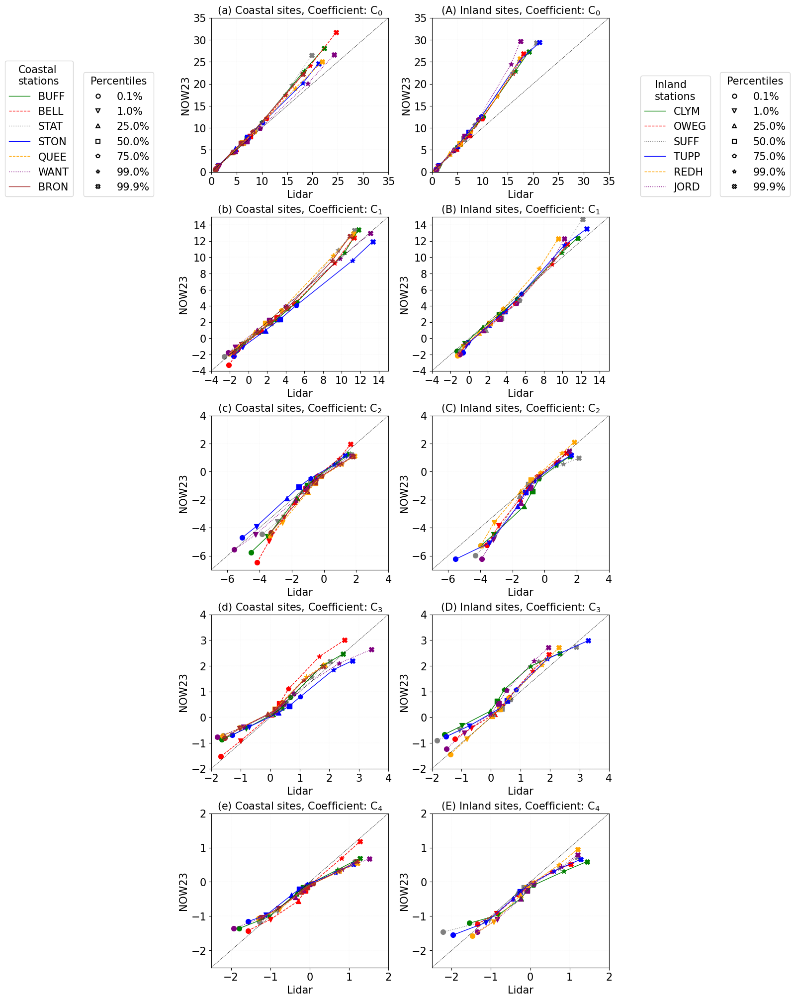

In [14]:
coastal_sites = ['PROF_BUFF','PROF_BELL','PROF_STAT','PROF_STON','PROF_QUEE','PROF_WANT','PROF_BRON']
inland_sites = ['PROF_CLYM','PROF_OWEG','PROF_SUFF','PROF_TUPP','PROF_REDH','PROF_JORD']
LIMS = [[0,35],[-4,15],[-7,4],[-2,4],[-2.5,2]]
TICKS = [[0,5,10,15,20,25,30,35],
         [-4,-2,0,2,4,6,8,10,12,14],
         [-6,-4,-2,0,2,4],
         [-2,-1,0,1,2,3,4],
         [-2,-1,0,1,2]]

percentiles = [0.001, 0.01, 0.25, 0.5, 0.75, 0.99, 0.999]

fig = plt.figure(figsize=(16, 20), constrained_layout=True)
gs = fig.add_gridspec(5, 4)
alphabets = [['(a)','(b)','(c)','(d)','(e)'], ['(A)','(B)','(C)','(D)','(E)']]

# Define colors for stations and markers for percentiles
colors = ['green', 'red', 'grey', 'blue', 'orange', 'purple', 'brown', 'cyan']
markers = ['o', 'v', '^', 's', 'p', '*', 'X']  # Different markers for percentiles
line_styles = ['-', '--', ':', '-','--',':','-']  # Different line styles for coefficients

for j, (site_type, site_ids) in enumerate(zip(['Coastal', 'Inland'], [coastal_sites, inland_sites])):
    fontsize = 15
    
    for coeff in range(5):
        row, col = coeff, j+1
        ylabel = 'NOW23'
        xlabel = 'Lidar'
        title = rf'{alphabets[j][coeff]} {site_type} sites, Coefficient: C$_{coeff}$'
        ax = fig.add_subplot(gs[row, col])

        station_handles = []  # Store handles for station legend
        percentile_handles = []  # Store handles for percentile legend (only created once)

        for i, station_id in enumerate(site_ids):
            profiler_coeff = profiler_coeff_all[station_id]
            NOW23_coeff = NOW23_coeff_all[station_id]
            color = colors[i]

            # Compute quantiles
            x_quantiles = np.quantile(profiler_coeff.sel(coeff=coeff), percentiles)
            y_quantiles = np.quantile(NOW23_coeff.sel(coeff=coeff), percentiles)

            # Plot the line without markers
            line, = ax.plot(x_quantiles, y_quantiles, linestyle=line_styles[i], color=color, label=station_id[5:], linewidth=1)
            station_handles.append(line)  # Store for legend

            # Add markers for different percentiles
            for k in range(len(percentiles)):
                marker_point = ax.scatter(x_quantiles[k], y_quantiles[k], facecolors=color, marker=markers[k], s=50, edgecolors=color)
                if i == 0:  # Only add to legend once
                    percentile_handles.append(marker_point)

        # Set plot limits
        min_value, max_value = LIMS[coeff]
        ax.set_xlim(min_value, max_value)
        ax.set_ylim(min_value, max_value)
        ax.set_xticks(TICKS[coeff])
        ax.set_yticks(TICKS[coeff])

        # Add 1:1 reference line
        ax.plot([min_value, max_value], [min_value, max_value], 'k--', linewidth=0.5)

        # Labels, titles, and formatting
        ax.set_xlabel(xlabel, fontsize=fontsize)
        ax.set_ylabel(ylabel, fontsize=fontsize)
        ax.set_title(title, fontsize=fontsize)
        ax.tick_params(axis='both', which='major', labelsize=fontsize)

        # Set dashed grid lines with specified line thickness
        ax.grid(True, linestyle=':', linewidth=0.1)

    # Create a common legend for stations (lines)
    bbox_to_anchor = (0.05, 0.8) if j == 0 else (0.85, 0.8)
    fig.legend(handles=station_handles, labels=[s[5:] for s in site_ids], loc='lower center', ncol=1, 
               bbox_to_anchor=bbox_to_anchor, fontsize=fontsize, title=f"{site_type}\nstations",title_fontsize=fontsize)

    # Create a second legend for percentiles (markers) with black edges
    legend_markers = [plt.Line2D([0], [0], marker=markers[k], color='black', markersize=6, linestyle='None', 
                                 markerfacecolor='none', markeredgecolor='black', markeredgewidth=1.5) 
                      for k in range(len(percentiles))]
    bbox_to_anchor = (0.15, 0.8) if j == 0 else (0.95, 0.8)
    fig.legend(handles=legend_markers, labels=[f'{p*100:.1f}%' for p in percentiles], loc='lower center', 
               bbox_to_anchor=bbox_to_anchor, ncol=1, fontsize=fontsize, title="Percentiles", title_fontsize=fontsize)

plt.savefig(f'{FIGDIR}/Profiler_vs_NOW23_Chebyshev_coeff_Q-Q_coastal_and_inland_locations_with_proper_quantile_ranges.pdf',
            bbox_inches='tight', dpi=300)

## Stationwise Chebyshev coefficient statistics

In [15]:
import pandas as pd
from collections import defaultdict
bias_list = []
r_list = []
crmse_list = []
emd_list = []
# Loop through each station and height level to gather Weibull coefficients
for station_id in coastal_sites + inland_sites:

    # Extract profiler and NOW23 data for the specified height and remove NaNs
    prof_values = profiler_coeff_all[station_id]
    now_values = NOW23_coeff_all[station_id]
    
    # Calculate Bias, R2, and cRMSE
    bias_val = now_values.mean(dim='time') - prof_values.mean(dim='time')
    r_val = xr.apply_ufunc(correlation_coefficient, prof_values, now_values,input_core_dims=[["time"], ["time"]],vectorize=True,)
    cRMSE_val = xr.apply_ufunc(centered_rmse, prof_values, now_values,input_core_dims=[["time"], ["time"]],vectorize=True,)
    emd_val = xr.apply_ufunc(Earth_Movers_Distance, prof_values, now_values,input_core_dims=[["time"], ["time"]],vectorize=True,)

    # Add station as dimension
    bias_val = bias_val.expand_dims({"station": [station_id]})
    r_val = r_val.expand_dims({"station": [station_id]})
    cRMSE_val = cRMSE_val.expand_dims({"station": [station_id]})
    emd_val = emd_val.expand_dims({"station": [station_id]})

    # Append to lists
    bias_list.append(bias_val)
    r_list.append(r_val)
    crmse_list.append(cRMSE_val)
    emd_list.append(emd_val)
    
# Concatenate all into 1 dataset per metric
bias_all = xr.concat(bias_list, dim="station")
r_all = xr.concat(r_list, dim="station")
crmse_all = xr.concat(crmse_list, dim="station")
emd_all = xr.concat(emd_list, dim="station")

# Combine into a dataset
ds_metrics = xr.Dataset({
    "Bias": bias_all,
    "r": r_all,
    "cRMSE": crmse_all,
    "EMD": emd_all
})

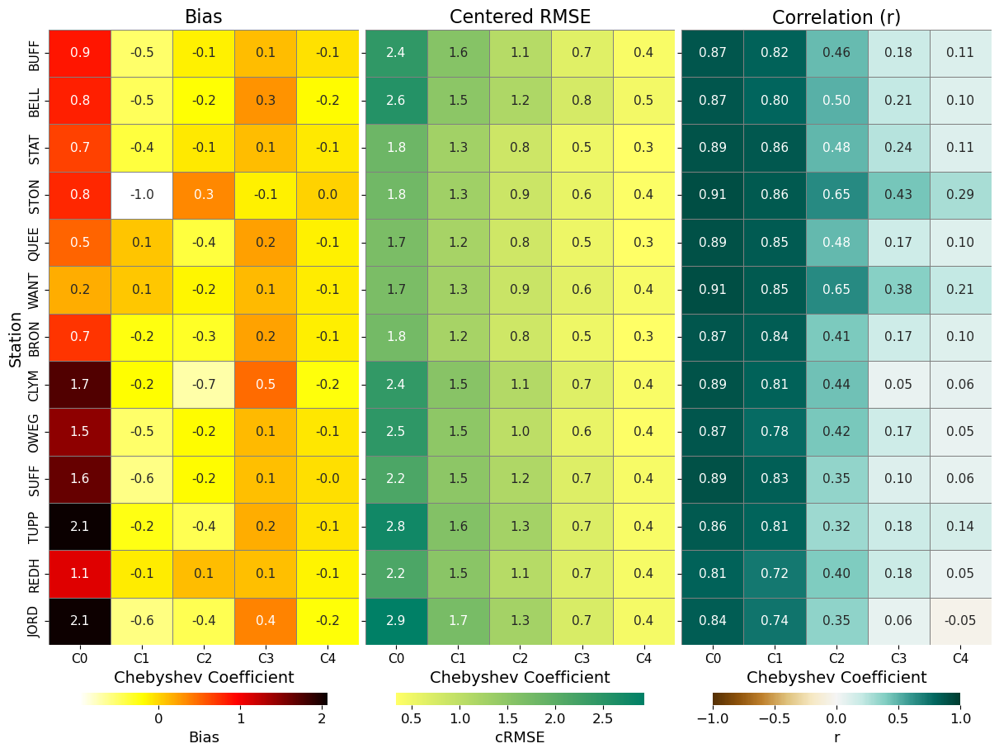

In [18]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

metrics = ['Bias', 'cRMSE', 'r']
metric_titles = ['Bias', 'Centered RMSE', 'Correlation (r)']
coeff_labels = [f'C{i}' for i in range(5)]
station_labels = [s[5:] for s in ds_metrics.station.values]

# Create 1x3 grid
fig, axes = plt.subplots(1, 3, figsize=(12, 9), constrained_layout=True, sharey=True)

for i, (ax, metric, title) in enumerate(zip(axes, metrics, metric_titles)):
    data = ds_metrics[metric].transpose('station', 'coeff').values

    # Select colorblind-friendly colormap and vmin/vmax
    if metric == 'r':
        cmap = 'BrBG'
        vmin, vmax = -1, 1
        fmt = ".2f"
    elif metric == 'Bias':
        cmap = 'hot_r'
        vmin, vmax = np.nanmin(data), np.nanmax(data)
        fmt = ".1f"
    else:
        cmap = 'summer_r'
        vmin, vmax = np.nanmin(data), np.nanmax(data)
        fmt = ".1f"

    # Plot heatmap
    heatmap = sns.heatmap(
        data,
        ax=ax,
        cmap=cmap,
        cbar=True,
        annot=True,
        fmt=fmt,
        annot_kws={"size": 11},
        cbar_kws={
            'orientation': 'horizontal',
            'label': metric,
            'shrink': 0.8,
            'pad': 0.01
        },
        xticklabels=coeff_labels,
        yticklabels=station_labels,
        vmin=vmin,
        vmax=vmax,
        linewidths=0.5,
        linecolor='gray'
    )

    ax.set_title(title, fontsize=16)
    ax.set_xlabel('Chebyshev Coefficient', fontsize=14)
    if i == 0:
        ax.set_ylabel('Station', fontsize=14)
    else:
        ax.set_ylabel('')

    # Make sure y-tick labels are readable
    if i == 0:
        ax.tick_params(axis='y', labelsize=11)
    ax.tick_params(axis='x', labelsize=11)

    # Set colorbar label and tick font size
    cbar = heatmap.collections[0].colorbar
    cbar.ax.tick_params(labelsize=12)  # <-- tick font size
    cbar.set_label(metric, fontsize=13)  # <-- label font size

# Save figure
plt.savefig(f'{FIGDIR}/Chebyshev_Coeff_Stationwise_metrics_Heatmaps_Annotated.pdf', dpi=300, bbox_inches='tight')

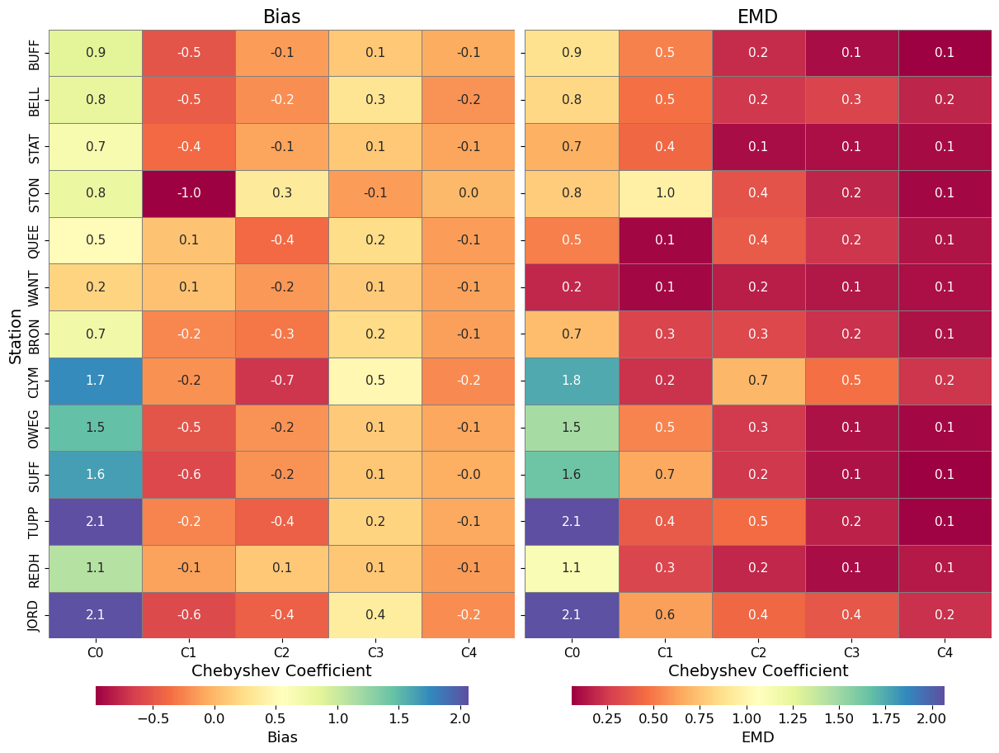

In [101]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

metrics = ['Bias', 'EMD']
metric_titles = ['Bias', 'EMD']
coeff_labels = [f'C{i}' for i in range(5)]
station_labels = [s[5:] for s in ds_metrics.station.values]

# Create 1x3 grid
fig, axes = plt.subplots(1, 2, figsize=(12, 9), constrained_layout=True, sharey=True)

for i, (ax, metric, title) in enumerate(zip(axes, metrics, metric_titles)):
    data = ds_metrics[metric].transpose('station', 'coeff').values

    # Select colorblind-friendly colormap and vmin/vmax
    if metric == 'r':
        cmap = 'BrBG'
        vmin, vmax = -1, 1
        fmt = ".2f"
    else:
        cmap = 'Spectral'
        vmin, vmax = np.nanmin(data), np.nanmax(data)
        fmt = ".1f"

    # Plot heatmap
    heatmap = sns.heatmap(
        data,
        ax=ax,
        cmap=cmap,
        cbar=True,
        annot=True,
        fmt=fmt,
        annot_kws={"size": 11},
        cbar_kws={
            'orientation': 'horizontal',
            'label': metric,
            'shrink': 0.8,
            'pad': 0.01
        },
        xticklabels=coeff_labels,
        yticklabels=station_labels,
        vmin=vmin,
        vmax=vmax,
        linewidths=0.5,
        linecolor='gray'
    )

    ax.set_title(title, fontsize=16)
    ax.set_xlabel('Chebyshev Coefficient', fontsize=14)
    if i == 0:
        ax.set_ylabel('Station', fontsize=14)
    else:
        ax.set_ylabel('')

    # Make sure y-tick labels are readable
    if i == 0:
        ax.tick_params(axis='y', labelsize=11)
    ax.tick_params(axis='x', labelsize=11)

    # Set colorbar label and tick font size
    cbar = heatmap.collections[0].colorbar
    cbar.ax.tick_params(labelsize=12)  # <-- tick font size
    cbar.set_label(metric, fontsize=13)  # <-- label font size

# Save figure
#plt.savefig(f'{FIGDIR}/Chebyshev_Coeff_Stationwise_metrics_Heatmaps_Annotated.pdf', dpi=300, bbox_inches='tight')

## correlation with respect to other sites

In [140]:
stations_all = coastal_sites + inland_sites
stations_all = ['STAT','STON','QUEE','WANT','BRON',
                'SUFF','REDH',
                'BUFF','BELL','CLYM','OWEG','TUPP','JORD']
# ADD PROF_ before each station name
stations_all = [f'PROF_{station}' for station in stations_all]
n_stations = len(stations_all)
n_coeffs = 5

profiler_coeff_corr_matrix = np.full((n_coeffs, n_stations, n_stations), np.nan)
now23_coeff_corr_matrix = np.full((n_coeffs, n_stations, n_stations), np.nan)

for dataset, corr_matrix in zip([profiler_coeff_all, NOW23_coeff_all], 
                                 [profiler_coeff_corr_matrix, now23_coeff_corr_matrix]):
    # Preload time series per station & coeff to avoid repeating .sel
    preloaded_data = {
        station: {
            coeff: dataset[station].sel(coeff=coeff)
            for coeff in range(n_coeffs)
        }
        for station in stations_all
    }

    # Preload time arrays too
    time_arrays = {
        station: dataset[station].time.values
        for station in stations_all
    }

    for coeff in range(n_coeffs):
        for i, station_x in enumerate(stations_all):
            x_data = preloaded_data[station_x][coeff]
            x_times = time_arrays[station_x]

            for j in range(i, n_stations):  # only compute upper triangle
                station_y = stations_all[j]

                if i == j:
                    corr_matrix[coeff, i, j] = 1.0
                    continue

                y_data = preloaded_data[station_y][coeff]
                y_times = time_arrays[station_y]

                # Find common times
                common_times = np.intersect1d(x_times, y_times)

                if len(common_times) < 10:
                    corr = np.nan
                else:
                    x_common = x_data.sel(time=common_times)
                    y_common = y_data.sel(time=common_times)
                    corr = np.corrcoef(x_common, y_common)[0, 1]

                # Fill both [i,j] and [j,i] due to symmetry
                corr_matrix[coeff, i, j] = corr
                corr_matrix[coeff, j, i] = corr

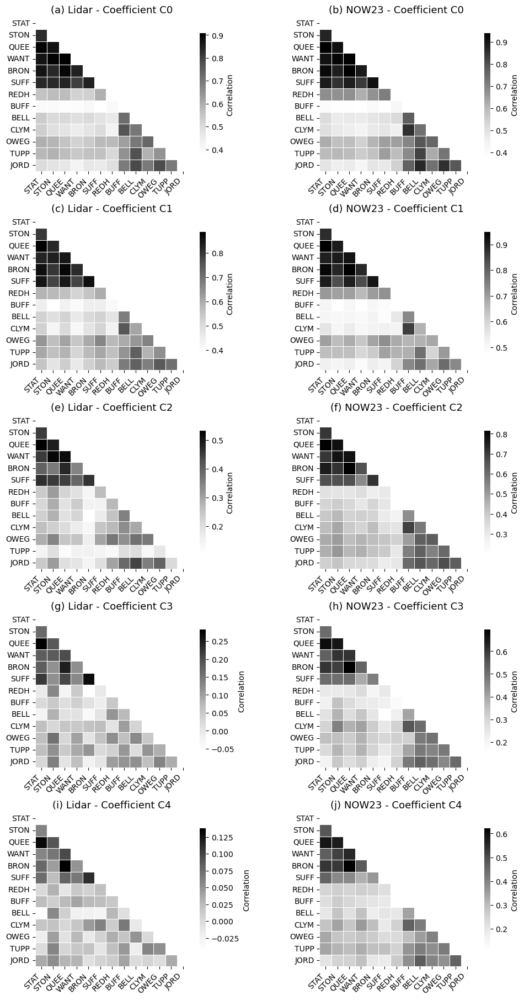

In [142]:
stations_all = ['STAT','STON','QUEE','WANT','BRON',
                'SUFF','REDH',
                'BUFF','BELL','CLYM','OWEG','TUPP','JORD']
coeff_labels = [f'C{i}' for i in range(5)]
alphabets = ['(a)','(b)','(c)','(d)','(e)','(f)','(g)','(h)','(i)','(j)','(k)','(l)','(m)','(n)','(o)','(p)','(q)','(r)','(s)','(t)','(u)','(v)','(w)','(x)','(y)','(z)']
fig, axes = plt.subplots(nrows=5, ncols=2, figsize=(10, 18), constrained_layout=True)

count=0
for coeff in range(5):
    for col, (data_matrix, title_prefix) in enumerate(zip(
        [profiler_coeff_corr_matrix, now23_coeff_corr_matrix],
        ['Lidar', 'NOW23']
    )):
        ax = axes[coeff, col]
        corr_df = pd.DataFrame(data_matrix[coeff,:,:], index=stations_all, columns=stations_all)
        # Mask upper triangle including diagonal
        mask = np.triu(np.ones_like(corr_df, dtype=bool), k=0)
        # Use linewidths only on unmasked (lower triangle)
        linewidths_mask = (~mask).astype(float) * 0.5  # 0.5 where not masked, 0.0 elsewhere
        sns.heatmap(
            corr_df,
            ax=ax,
            cmap='Greys',
            annot=False,
            fmt=".2f",
            linewidths=0.5,
            linecolor='white',
            square=True,
            cbar_kws={'label': 'Correlation','shrink':0.8},
            xticklabels=stations_all,
            mask = mask,
            yticklabels=stations_all  # 👈 This controls yticklabels
        )

        ax.set_title(f"{alphabets[count]} {title_prefix} - Coefficient {coeff_labels[coeff]}", fontsize=13)
        ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')
        ax.set_yticklabels(ax.get_yticklabels(), rotation=0, ha='right')# if col == 0 else None
        count+=1


plt.savefig(f"{FIGDIR}/Profiler_NOW23_intrastationwise_coeff_Correlation_Heatmaps.pdf", dpi=300, bbox_inches='tight')

## Seasonal-diurnal cycles

In [15]:
months = ['Dec','Jan','Feb','Mar','Apr','May','Jun','Jul','Aug','Sep','Oct','Nov']
seasons = ['DJF','MAM','JJA','SON']
def seasonal_hourly_cycle_df(data):
    seasonal_df = pd.DataFrame()
    # Iterate over months
    for j, season in enumerate(seasons):
        hourly_df = pd.DataFrame()
        
        # Iterate over each hour
        for hour in range(0, 24):
            # Extract data for the current month, hour, and minute
            mean_data = data.sel(
                time=(data.time.dt.season == season) & 
                    (data.time.dt.hour == hour)
            ).mean().values
                
            # Create a DataFrame for the current time slot
            df = pd.DataFrame({hour: mean_data}, index=pd.Index([season], name='season'))
            
            # Concatenate the hourly data for the current month
            hourly_df = pd.concat([hourly_df, df], axis=1)
        
        # Concatenate the monthly data
        seasonal_df = pd.concat([seasonal_df, hourly_df], axis=0)

    # The resulting DataFrame has a shape of 12 x 144 (12 months, 144 time intervals)
    return seasonal_df

In [16]:
# Compute the monthly diurnal cycle for the profiler data and NOW23 data, for all coefficients, and for all stations. Finally, save them to a dictonary
data_types = ['profiler', 'NOW23']
hourly_data_dict = {}
for data_type in data_types:
    hourly_data_dict[data_type] = {}
    for i, station_id in enumerate(test_station_ids):
        hourly_data_dict[data_type][station_id] = {}
        for coeff in range(5):
            if data_type == 'profiler':
                data = profiler_coeff_all[station_id].sel(coeff=coeff)
            else:
                data = NOW23_coeff_all[station_id].sel(coeff=coeff)
            hourly_data_dict[data_type][station_id][coeff] = seasonal_hourly_cycle_df(data)

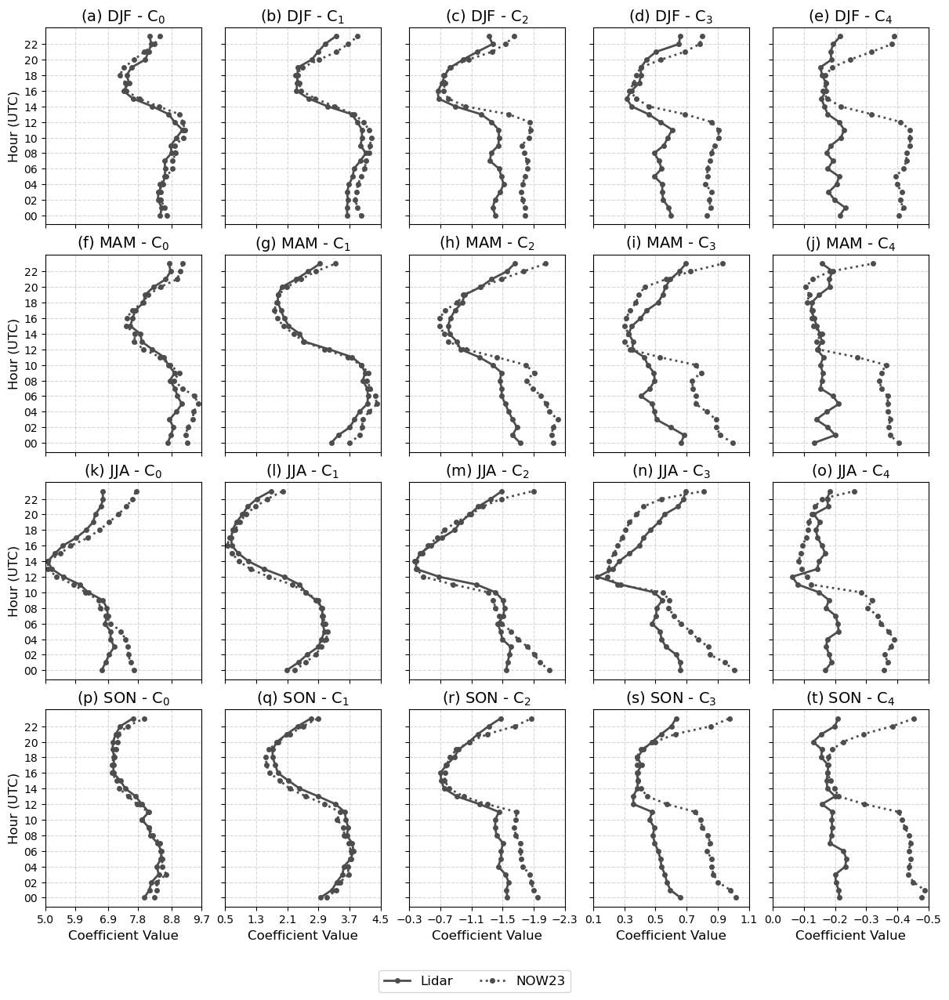

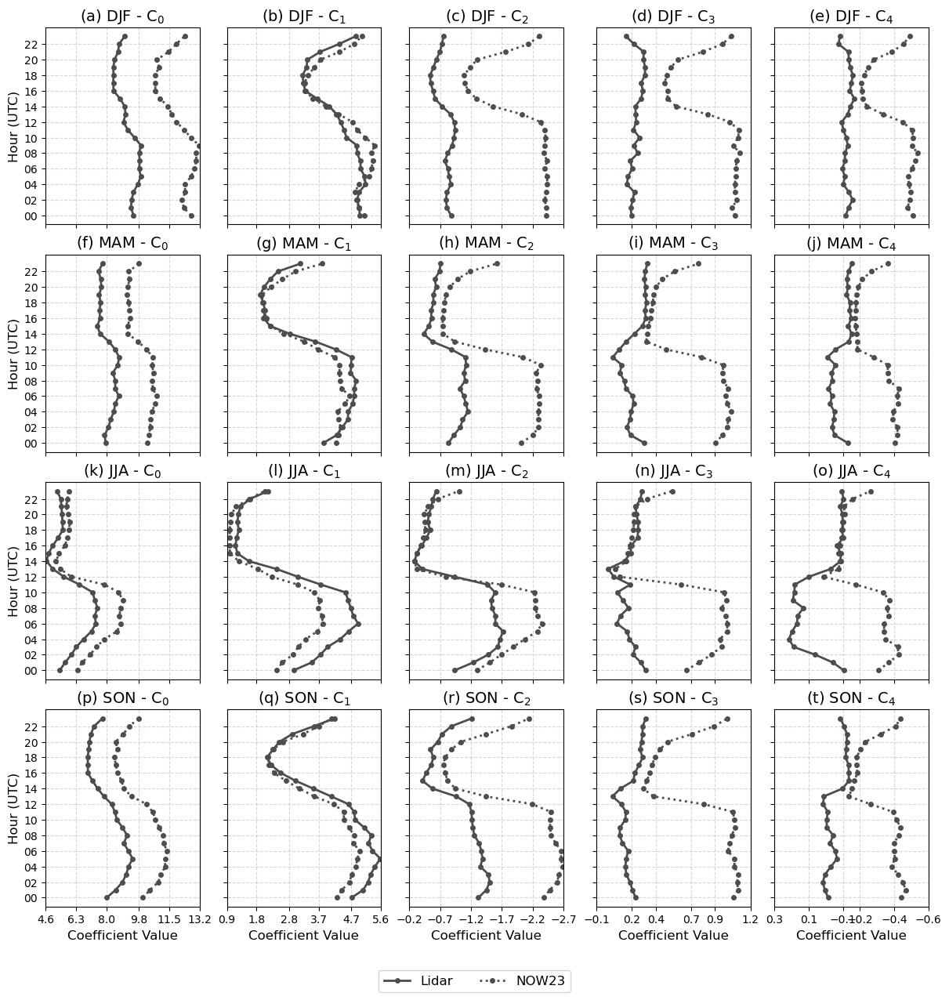

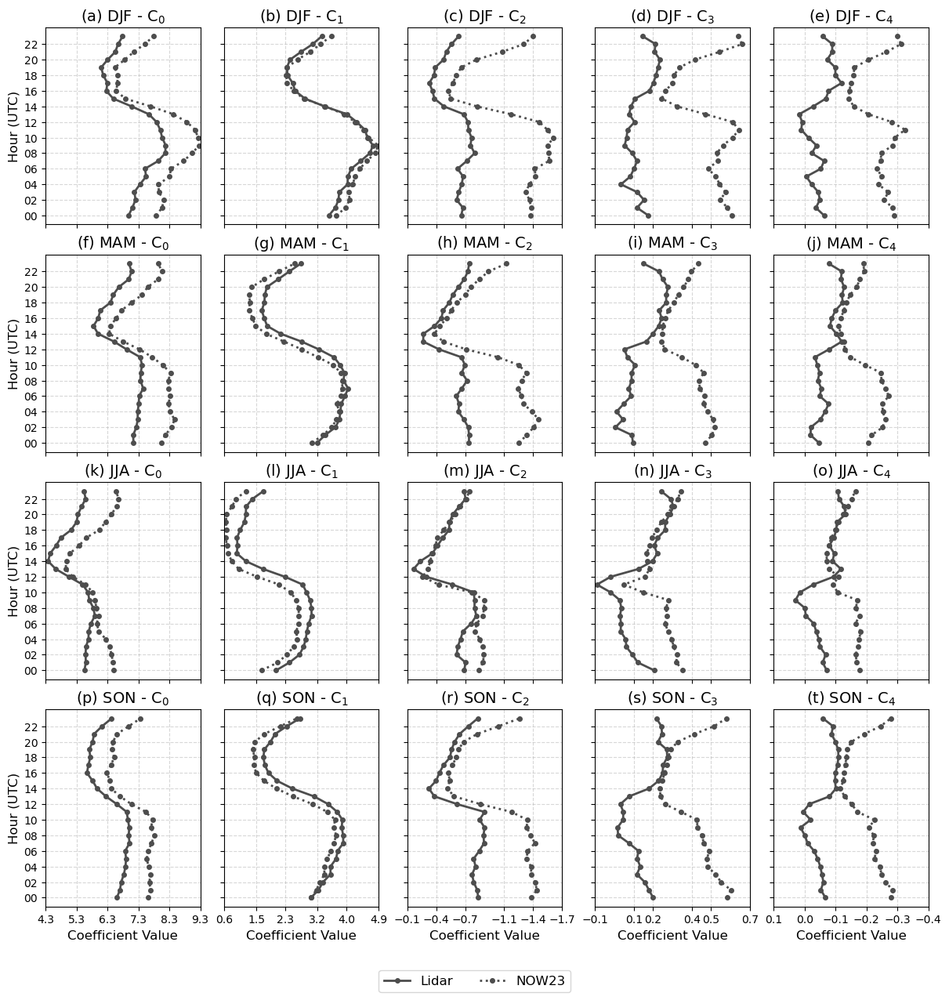

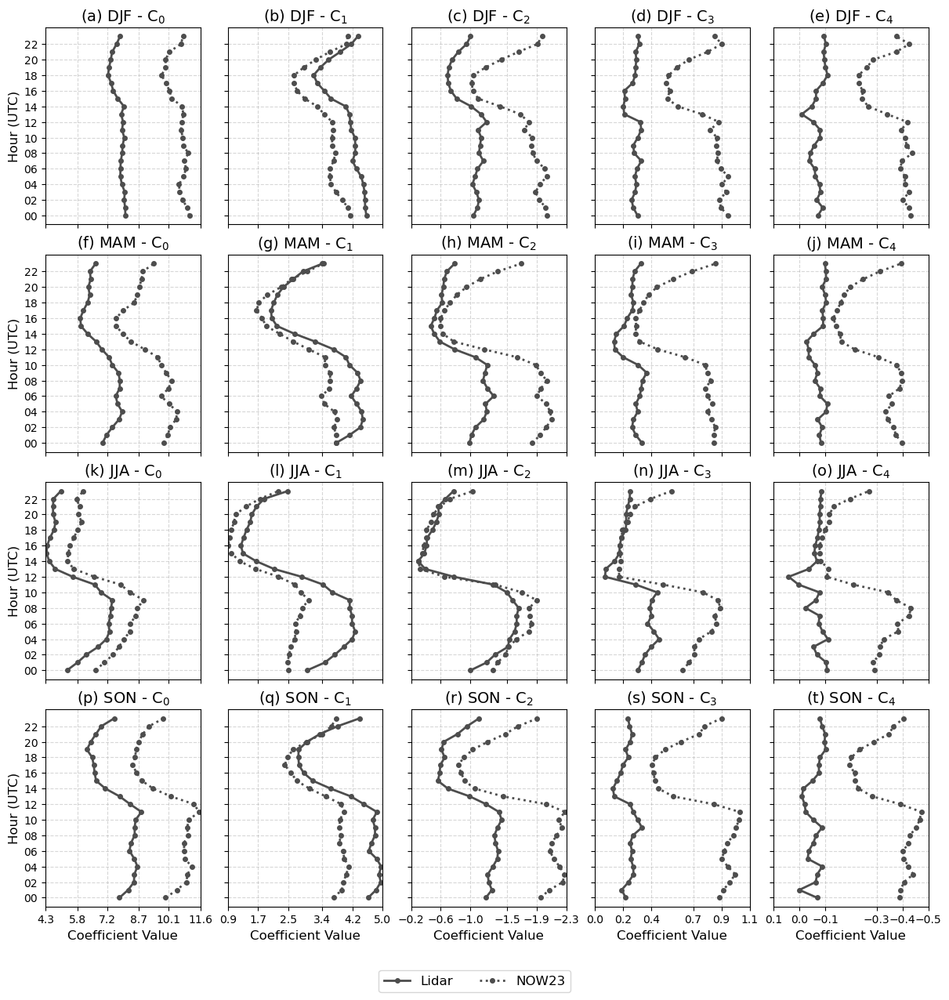

In [18]:
# Define settings
coeffs = range(5)
seasons = ['DJF', 'MAM', 'JJA', 'SON']
stations = coastal_sites  # or inland_sites
colors = [f"{i/10:.1f}" for i in range(3, 10)]  # different gray levels
linestyles = {'profiler': '-', 'NOW23': ':'}
markers = ['o', 's', 'D', '^', 'v', '>', '<']
fontsize = 12
alphabets = ['(a)','(b)','(c)','(d)','(e)','(f)','(g)','(h)','(i)','(j)','(k)','(l)','(m)','(n)','(o)','(p)','(q)','(r)','(s)','(t)','(u)','(v)','(w)','(x)','(y)','(z)']
for station_id in ['PROF_WANT','PROF_CLYM','PROF_BRON','PROF_JORD']:
    # Create figure
    fig, axes = plt.subplots(4, 5, figsize=(12, 12), sharey=True, constrained_layout=True)
    count = 0
    for row, season in enumerate(seasons):
        for col, coeff in enumerate(coeffs):
            ax = axes[row, col]

            color = colors[0]
            marker = markers[0]
            for data_type in ['profiler', 'NOW23']:
                df = hourly_data_dict[data_type][station_id][coeff]
                ax.plot(
                    df.loc[season],
                    df.columns,
                    linestyle=linestyles[data_type],
                    color=color,
                    marker=marker,
                    markersize=4,
                    linewidth=2,
                    label='Lidar' if data_type == 'profiler' else 'NOW23'
                )
            ax.grid(True, linestyle='--', alpha=0.5)

            #if row == 0:
            ax.set_title(fR"{alphabets[count]} {season} - C$_{col}$", fontsize=fontsize+2)
            count += 1

            # Only label y-axis on first column
            if col == 0:
                ax.set_ylabel(f'Hour (UTC)', fontsize=fontsize)
                ax.set_yticks(np.arange(0, 24, 2))
                ax.set_yticklabels(['00', '02', '04', '06', '08', '10', '12', '14', '16', '18', '20', '22'])

    # Set xlim per column (shared within each column only)
    for col in range(len(coeffs)):
        x_data_all = []
        for row in range(len(seasons)):
            ax = axes[row, col]
            for line in ax.get_lines():
                x_data_all.extend(line.get_xdata())

        if len(x_data_all) > 0:
            x_min, x_max = np.min(x_data_all), np.max(x_data_all)
            x_min = np.floor(np.min(x_data_all) * 10) / 10  # round down to nearest 0.1
            x_max = np.ceil(np.max(x_data_all) * 10) / 10   # round up to nearest 0.1
            for row in range(len(seasons)):
                axes[row, col].set_xlim(x_min, x_max)
                axes[row, col].set_xticks(np.round(np.linspace(x_min, x_max, 6),1))
                
                # Reverse x-axis for Coefficients 2 and 4
                if col in [2, 4]:
                    axes[row,col].invert_xaxis()

                if row == len(seasons) - 1:
                    axes[row,col].set_xlabel("Coefficient Value", fontsize=fontsize)
                else:
                    axes[row,col].set_xticklabels([])

    # Legend outside plot
    handles, labels = axes[0, 0].get_legend_handles_labels()
    fig.legend(handles, labels, loc='upper center', bbox_to_anchor=(0.5, -0.02), ncol=2, fontsize=fontsize)

    plt.savefig(f'{FIGDIR}/{station_id}_Seasonal_hourly_cycle_coefficients.pdf', dpi=300, bbox_inches='tight')

## Expected mean profiles

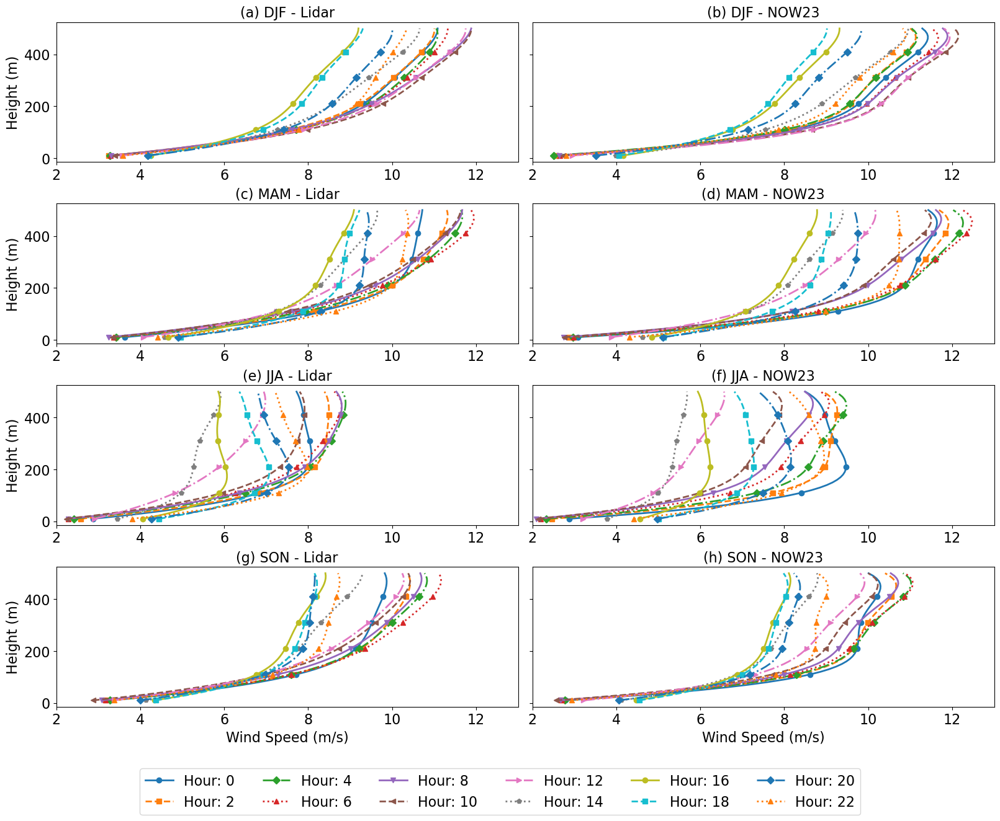

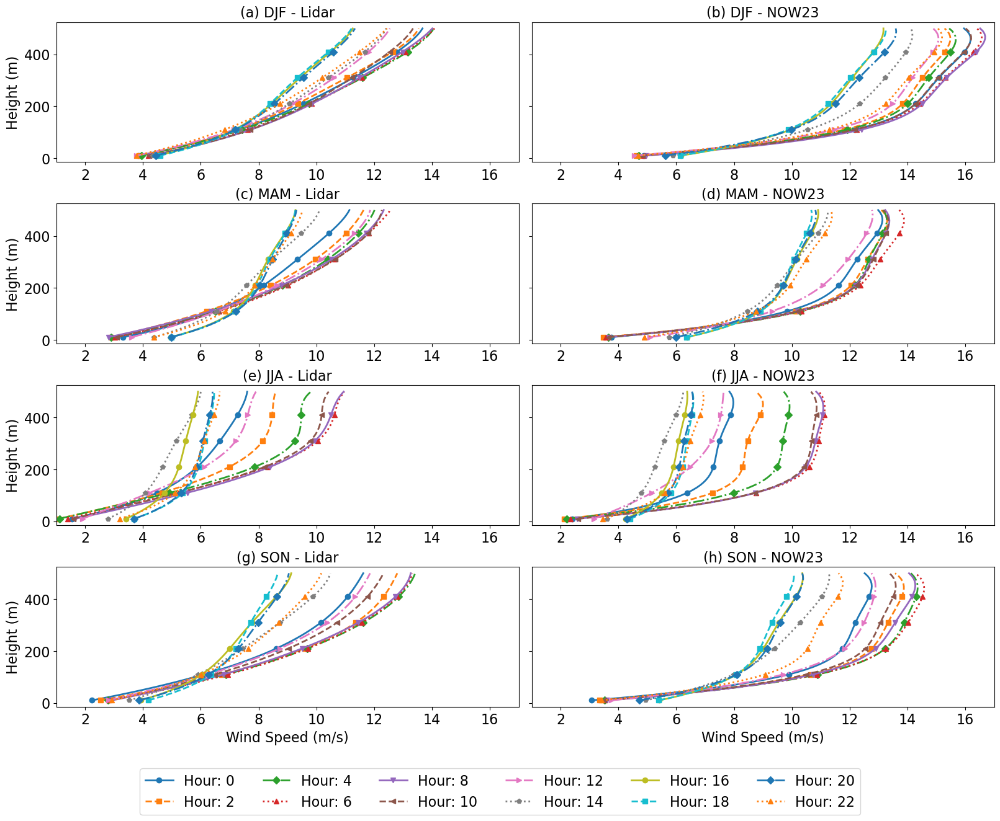

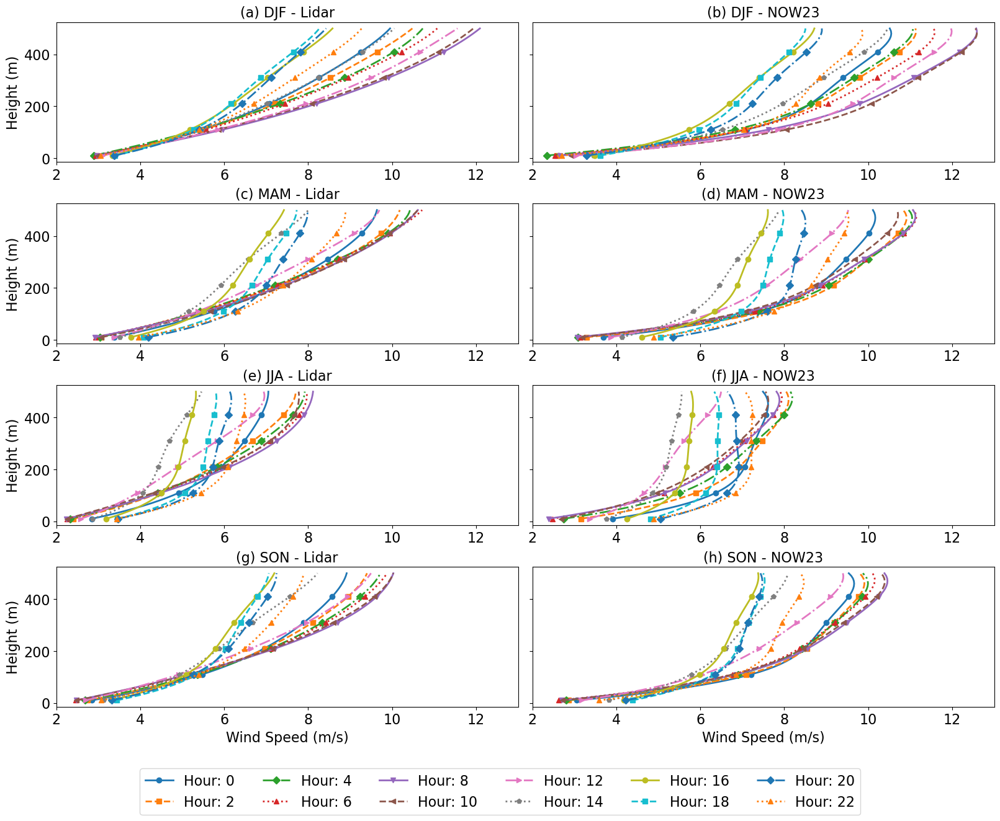

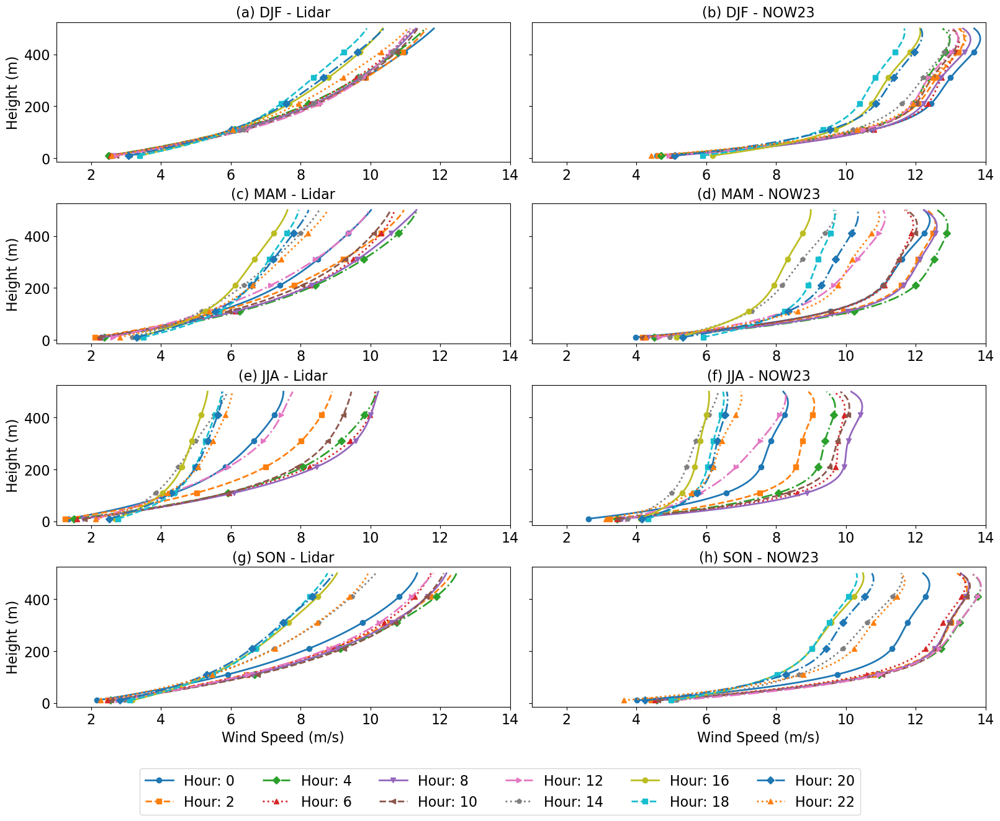

In [19]:
# Define months in order from Dec to Nov
seasons = ['DJF', 'MAM', 'JJA', 'SON']

# Define hours at 3-hour intervals
hours = np.arange(0, 24, 2)

# Define markers for different lines (8 markers for 8 different hours)
markers = ['o', 's', 'D', '^', 'v', '<', '>', 'p']  # 8 unique markers
line_styles = ['-', '--', '-.', ':']  # 4 unique line styles
alphabets = ['(a)', '(b)', '(c)', '(d)', '(e)', '(f)', '(g)', '(h)']

fontsize = 16
for station_id in ['PROF_WANT','PROF_CLYM','PROF_BRON','PROF_JORD']:
    fig, axes = plt.subplots(nrows=4, ncols=2, figsize=(16, 12), constrained_layout=True)

    wind_speed_values = []  # Store all wind speeds to determine xtick limits
    for i, season in enumerate(seasons):
        for j, data_type in enumerate(data_types):
            row, col = i, j
            ax = axes[row, col]  # Assign subplot location

            for h_idx, k in enumerate(hours):
                # Extract Chebyshev coefficients for the selected month and hour
                ChSh = [hourly_data_dict[data_type][station_id][j].loc[season][k] for j in range(5)]

                # Define reference logarithmic wind profile parameters
                u_star = 0.3  # Friction velocity (m/s)
                kappa = 0.41  # von Kármán constant
                z0 = 0.1      # Roughness length (m)

                z = np.arange(10, 500.1, 10)  # Height levels
                M = WindProfile(z, ChSh, poly_order=4, CPtype=1, ref_H=ref_H)

                wind_speed_values.extend(M)  # Collect wind speed values for dynamic xticks

                # Plot with markers and lines
                ax.plot(M, z, label=f'Hour: {k}', linestyle=line_styles[h_idx % len(line_styles)], 
                        marker=markers[h_idx % len(markers)], markevery=10, linewidth=2)
                #ax.set_yscale('log')

            ax.set_xlim(0, 12)
            ax.set_title(f'{alphabets[i * 2 + j]} {season} - {"Lidar" if data_type == "profiler" else "NOW23"}', fontsize=fontsize)

            if row == 3:
                ax.set_xlabel('Wind Speed (m/s)', fontsize=fontsize)
            else:
                ax.set_xlabel('')

            if col == 0:
                ax.set_ylabel('Height (m)', fontsize=fontsize)
            else:
                ax.set_yticklabels([])
                ax.set_ylabel('')

            ax.tick_params(axis='both', which='major', labelsize=fontsize)
    
    # Set common x-axis limits for all subplots
    x_min = np.floor(np.array(wind_speed_values).min())
    x_max = np.ceil(np.array(wind_speed_values).max())
    for ax in axes.flat:
        ax.set_xlim(x_min, x_max)
        #ax.set_xticks(np.arange(0, 13, 2))
        #ax.set_xticklabels(np.arange(0, 13, 2))

    handles, labels = ax.get_legend_handles_labels()
    fig.legend(handles, labels, loc='lower center', ncol=6, fontsize=fontsize, bbox_to_anchor=(0.5, -0.1))

    plt.savefig(f'{FIGDIR}/{station_id}_seasonal_wind_profiles.pdf', bbox_inches='tight', dpi=300)

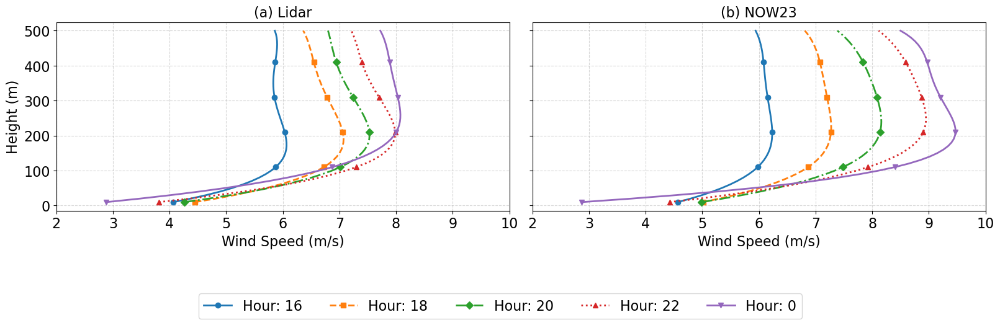

In [132]:
# Define months in order from Dec to Nov
seasons = ['JJA']

# Define hours at 3-hour intervals
hours = np.arange(0, 24, 2)

# Define markers for different lines (8 markers for 8 different hours)
markers = ['o', 's', 'D', '^', 'v', '<', '>', 'p']  # 8 unique markers
line_styles = ['-', '--', '-.', ':']  # 4 unique line styles
alphabets = ['(a)', '(b)', '(c)', '(d)', '(e)', '(f)', '(g)', '(h)']

fontsize = 16
for station_id in ['PROF_WANT']:
    fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(16, 4), constrained_layout=True)

    wind_speed_values = []  # Store all wind speeds to determine xtick limits
    for i, season in enumerate(seasons):
        for j, data_type in enumerate(data_types):
            row, col = i, j
            ax = axes[col]  # Assign subplot location

            for h_idx, k in enumerate([16, 18, 20, 22,0]):
                # Extract Chebyshev coefficients for the selected month and hour
                ChSh = [hourly_data_dict[data_type][station_id][j].loc[season][k] for j in range(5)]

                # Define reference logarithmic wind profile parameters
                u_star = 0.3  # Friction velocity (m/s)
                kappa = 0.41  # von Kármán constant
                z0 = 0.1      # Roughness length (m)

                z = np.arange(10, 500.1, 10)  # Height levels
                M = WindProfile(z, ChSh, poly_order=4, CPtype=1, ref_H=ref_H)

                wind_speed_values.extend(M)  # Collect wind speed values for dynamic xticks

                # Plot with markers and lines
                ax.plot(M, z, label=f'Hour: {k}', linestyle=line_styles[h_idx % len(line_styles)], 
                        marker=markers[h_idx % len(markers)], markevery=10, linewidth=2)
                #ax.set_yscale('log')

            ax.set_xlim(0, 12)
            ax.set_title(f'{alphabets[i * 2 + j]} {"Lidar" if data_type == "profiler" else "NOW23"}', fontsize=fontsize)

            if row == 0:
                ax.set_xlabel('Wind Speed (m/s)', fontsize=fontsize)
            else:
                ax.set_xlabel('')

            if col == 0:
                ax.set_ylabel('Height (m)', fontsize=fontsize)
            else:
                ax.set_yticklabels([])
                ax.set_ylabel('')

            ax.tick_params(axis='both', which='major', labelsize=fontsize)
            ax.grid(True, linestyle='--', alpha=0.5)
    
    # Set common x-axis limits for all subplots
    x_min = np.floor(np.array(wind_speed_values).min())
    x_max = np.ceil(np.array(wind_speed_values).max())
    for ax in axes.flat:
        ax.set_xlim(x_min, x_max)
        #ax.set_xticks(np.arange(0, 13, 2))
        #ax.set_xticklabels(np.arange(0, 13, 2))

    handles, labels = ax.get_legend_handles_labels()
    fig.legend(handles, labels, loc='lower center', ncol=6, fontsize=fontsize, bbox_to_anchor=(0.5, -0.3))

    plt.savefig(f'{FIGDIR}/{station_id}_{season}_wind_profiles.pdf', bbox_inches='tight', dpi=300)

## Mean profiles from wind speed profiles

In [350]:
# Compute the monthly diurnal cycle for the profiler data and NOW23 data, for all coefficients, and for all stations. Finally, save them to a dictonary
data_types = ['profiler', 'NOW23']
hourly_data_dict_profiles = {}
for data_type in data_types:
    hourly_data_dict_profiles[data_type] = {}
    for i, station_id in enumerate(['PROF_WANT','PROF_CLYM','PROF_BRON','PROF_JORD']):
        hourly_data_dict_profiles[data_type][station_id] = {}
        if data_type == 'profiler':
            data = profiler_profiles_all[station_id]
        else:
            data = NOW23_profiles_all[station_id]
        for level in data.levels.values:
            hourly_data_dict_profiles[data_type][station_id][level] = seasonal_hourly_cycle_df(data.sel(levels=level))

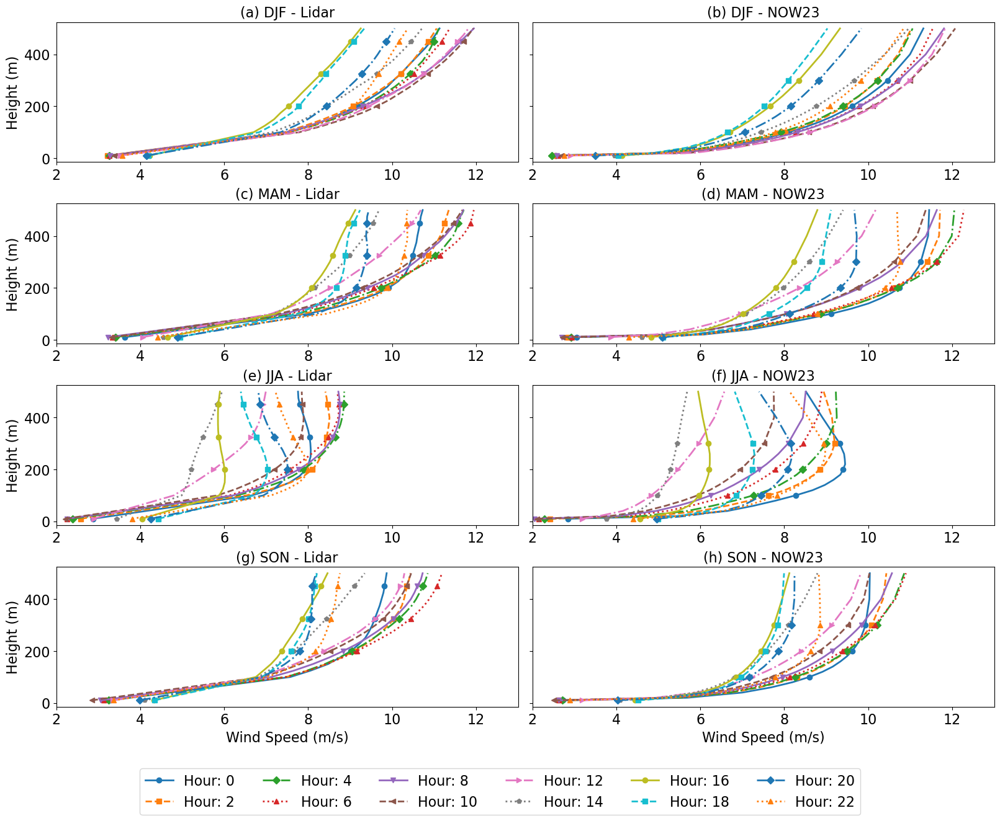

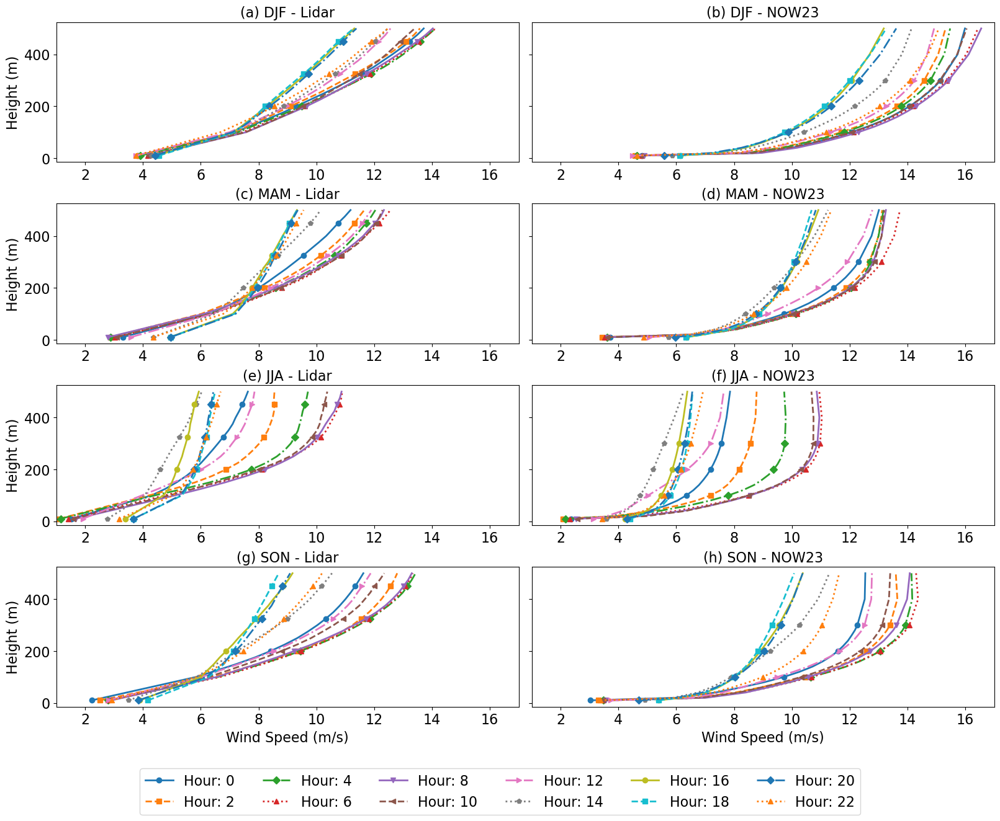

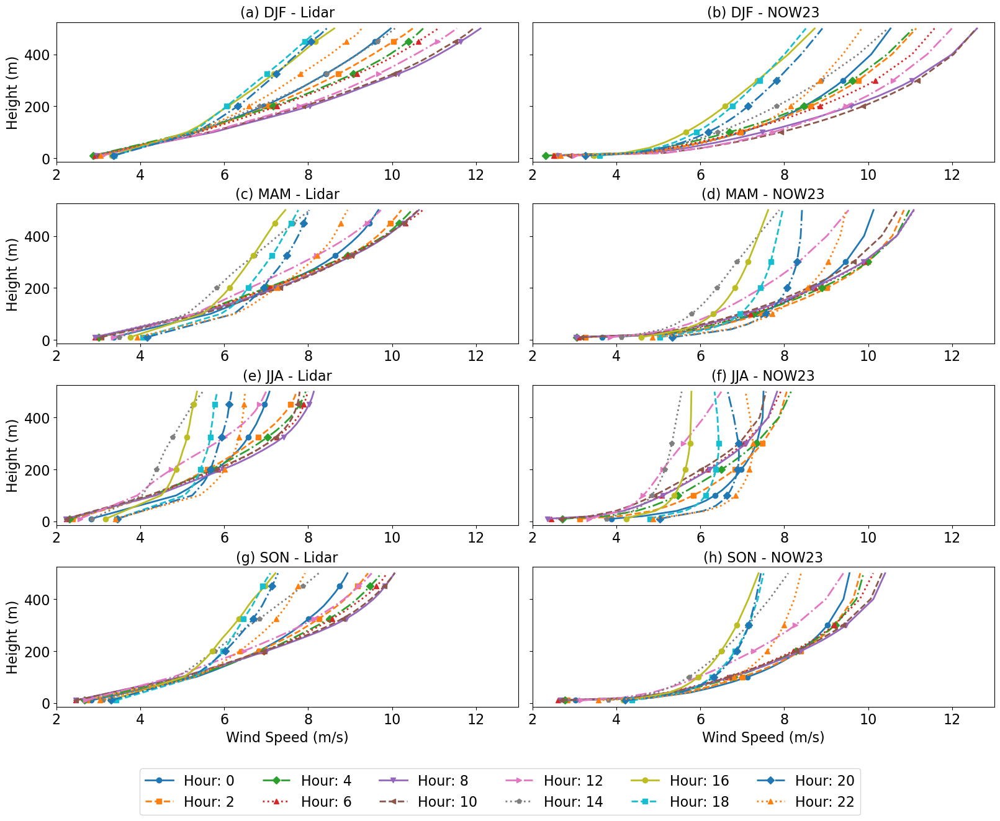

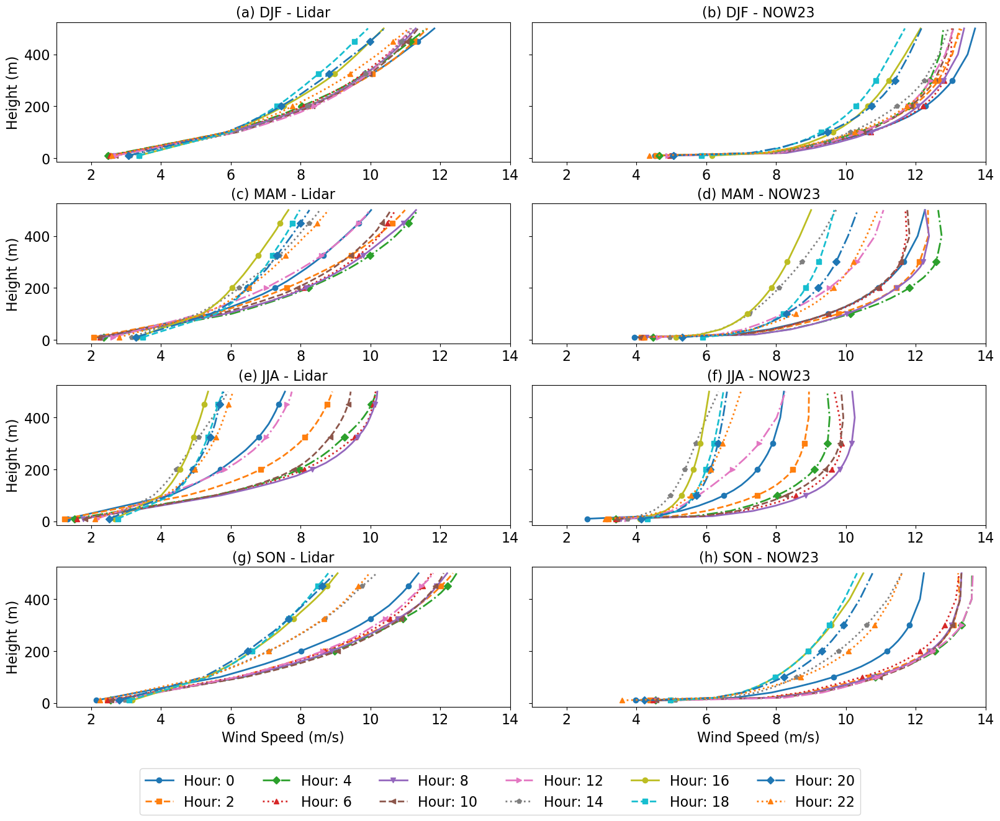

In [362]:
# Define months in order from Dec to Nov
seasons = ['DJF', 'MAM', 'JJA', 'SON']

# Define hours at 3-hour intervals
hours = np.arange(0, 24, 2)

# Define markers for different lines (8 markers for 8 different hours)
markers = ['o', 's', 'D', '^', 'v', '<', '>', 'p']  # 8 unique markers
line_styles = ['-', '--', '-.', ':']  # 4 unique line styles
alphabets = ['(a)', '(b)', '(c)', '(d)', '(e)', '(f)', '(g)', '(h)']

fontsize = 16
for station_id in ['PROF_WANT','PROF_CLYM','PROF_BRON','PROF_JORD']:
    fig, axes = plt.subplots(nrows=4, ncols=2, figsize=(16, 12), constrained_layout=True)

    wind_speed_values = []  # Store all wind speeds to determine xtick limits
    for i, season in enumerate(seasons):
        for j, data_type in enumerate(data_types):
            row, col = i, j
            ax = axes[row, col]  # Assign subplot location


            for h_idx, k in enumerate(hours):
                # Extract Chebyshev coefficients for the selected month and hour
                df = hourly_data_dict_profiles[data_type][station_id]
                z = list(df.keys())
                M = [df[level].loc[season][k] for level in z]

                wind_speed_values.extend(M)  # Collect wind speed values for dynamic xticks

                # Plot with markers and lines
                ax.plot(M, z, label=f'Hour: {k}', linestyle=line_styles[h_idx % len(line_styles)], 
                        marker=markers[h_idx % len(markers)], markevery=5, linewidth=2)
                #ax.set_yscale('log')

            ax.set_xlim(0, 12)
            ax.set_title(f'{alphabets[i * 2 + j]} {season} - {"Lidar" if data_type == "profiler" else "NOW23"}', fontsize=fontsize)

            if row == 3:
                ax.set_xlabel('Wind Speed (m/s)', fontsize=fontsize)
            else:
                ax.set_xlabel('')

            if col == 0:
                ax.set_ylabel('Height (m)', fontsize=fontsize)
            else:
                ax.set_yticklabels([])
                ax.set_ylabel('')

            ax.tick_params(axis='both', which='major', labelsize=fontsize)
        
    # Set common x-axis limits for all subplots
    x_min = np.floor(np.array(wind_speed_values).min())
    x_max = np.ceil(np.array(wind_speed_values).max())
    for ax in axes.flat:
        ax.set_xlim(x_min, x_max)
        #ax.set_xticks(np.arange(0, 13, 2))
        #ax.set_xticklabels(np.arange(0, 13, 2))

    handles, labels = ax.get_legend_handles_labels()
    fig.legend(handles, labels, loc='lower center', ncol=6, fontsize=fontsize, bbox_to_anchor=(0.5, -0.1))

    plt.savefig(f'{FIGDIR}/{station_id}_seasonal_wind_profiles_from_wind_profiles.pdf', bbox_inches='tight', dpi=300)

# Identifying negative wind speed profiles

In [11]:
condition = (
    (profiler_coeff_combined.sel(coeff=0) > 5)
    & (profiler_coeff_combined.sel(coeff=1) < -0.) 
    & (profiler_coeff_combined.sel(coeff=2) > 0)
    & (profiler_coeff_combined.sel(coeff=3) < -0.)
    & (profiler_coeff_combined.sel(coeff=4) > 0)
)
condition = condition.reset_coords(names='coeff', drop=True) if 'coeff' in condition.coords else condition
# Filter the profiles based on condition
selected_profiles = profiler_profiles_combined.where(condition, drop=True)
selected_coefficients = profiler_coeff_combined.where(condition, drop=True)

# Get number of valid time steps
n_times = selected_profiles.sizes['time']
n_times

8

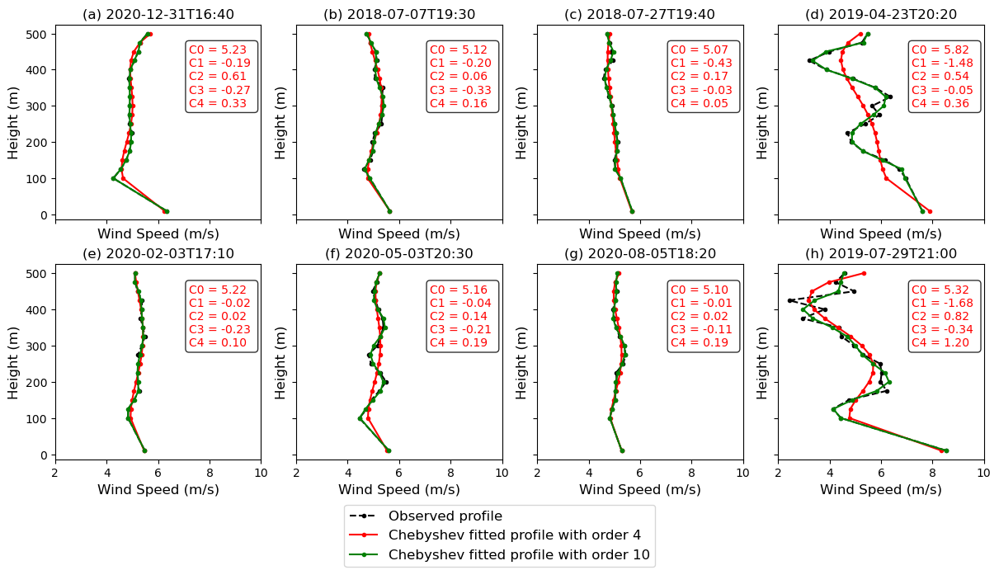

In [51]:
# Calculate square subplot grid
n_cols = 4
n_rows = 2

# Create figure and axes
fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols * 3, n_rows * 3), sharey=True, sharex=True, constrained_layout=True)
axes = axes.flatten()

# Plot each time step
for i in range(n_times):
    ax = axes[i]
    M = selected_profiles.isel(time=i)
    Z = M.levels.values
    ax.plot(M, Z, '.--k', label='Observed profile')
    
    ChSh = Chebyshev_Coeff(Z,M.values, poly_order=4, CPtype=1, ref_H=ref_H)
    Mp = WindProfile(Z, ChSh, poly_order=4, CPtype=1, ref_H=ref_H)
    ax.plot(Mp, Z, '.-r', label='Chebyshev fitted profile with order 4')
    ax.text(0.65, 0.9, 
            f'C0 = {ChSh[0]:.2f} \nC1 = {ChSh[1]:.2f} \nC2 = {ChSh[2]:.2f} \nC3 = {ChSh[3]:.2f} \nC4 = {ChSh[4]:.2f}',
                      transform=ax.transAxes, verticalalignment='top', bbox=dict(boxstyle='round', facecolor='white', alpha=0.8),fontsize=10, color='red')
    
    ChSh = Chebyshev_Coeff(Z,M.values, poly_order=10, CPtype=1, ref_H=ref_H)
    Mp = WindProfile(Z, ChSh, poly_order=10, CPtype=1, ref_H=ref_H)
    ax.plot(Mp, Z, '.-g', label='Chebyshev fitted profile with order 10')
    ax.set_title(f"({get_subcaption(i)}) {str(selected_profiles.time.isel(time=i).values)[:16]}")
    ax.set_xlabel('Wind Speed (m/s)', fontsize=12)
    ax.set_ylabel('Height (m)', fontsize=12)
    ax.set_xlim(2, 10)
    #ax.invert_yaxis()

# Turn off extra axes
for j in range(n_times, len(axes)):
    axes[j].axis('off')

# show common legend below the plot
handles, labels = axes[0].get_legend_handles_labels()
fig.legend(handles, labels, loc='lower center', ncol=1, fontsize=12, bbox_to_anchor=(0.5, -0.15))
#plt.suptitle('Non-monotonic Wind Profiles and Chebyshev Fits', fontsize=16)

plt.savefig(f'{FIGDIR}/nonmonotonic_wind_profiles.pdf', bbox_inches='tight', dpi=300)

In [47]:
FIGDIR

'/home/harish/Dropbox/Apps/Overleaf/Wind_Energy_Chebyshev_based_wind_profile_evaluaiton'